In [1]:
%load_ext autoreload
%autoreload 2

import sys
import os
import time

import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np

sys.path.append(os.path.join(os.environ['REPO_DIR'], 'utilities'))
from utilities2015 import *
from registration_utilities import *
from annotation_utilities import *
from metadata import *
from data_manager import *

/usr/local/lib/python2.7/dist-packages/matplotlib/__init__.py:1405: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)


Setting environment for AWS compute node


No vtk


In [2]:
stack_fixed = 'MD595'
stack_moving = 'atlasV5'
# stack_moving = 'atlasV3'

In [3]:
# classifier_setting = 38
# warp_setting = 15
detector_id = 15
warp_setting = 15

In [4]:
registration_settings

,upstream_warp_id,transform_type,terminate_thresh,grad_computation_sample_number,grid_search_sample_number,std_tx_um,std_ty_um,std_tz_um,std_theta_xy_degree,surround_weight,regularization_weight,comment,max_iter_num
warp_id,,,,,,,,,,,,,
1,None,affine,0.000010,100000.0,1000.0,2000.0,2000.0,2000.0,30.0,0,NaN,NaN,NaN
2,1,rigid,0.000010,100000.0,10000.0,100.0,100.0,100.0,30.0,0,NaN,NaN,NaN
4,1,rigid,0.000001,100000.0,10000.0,100.0,100.0,100.0,10.0,0,0.000001,NaN,NaN
5,1,rigid,0.000001,100000.0,10000.0,100.0,100.0,100.0,30.0,inverse,0.000000,NaN,NaN
6,1,affine,0.000010,100000.0,10000.0,100.0,100.0,100.0,30.0,-0.5,0.000000,NaN,NaN
7,None,rigid,0.000001,100000.0,1000.0,50.0,50.0,50.0,10.0,0,NaN,NaN,NaN
8,None,rigid,0.000001,100000.0,10000.0,200.0,200.0,200.0,30.0,inverse,0.000000,align mid-sagittal planes,NaN
9,8,rigid,0.000001,100000.0,10000.0,2000.0,2000.0,2000.0,30.0,NaN,NaN,global registration given mid-sagittal planes ...,NaN
10,None,rigid,0.000010,100000.0,1000.0,100.0,100.0,100.0,30.0,0,NaN,NaN,NaN


In [5]:
warp_properties = registration_settings.loc[warp_setting]
print warp_properties

upstream_warp_setting = warp_properties['upstream_warp_id']
if upstream_warp_setting == 'None':
    upstream_warp_setting = None
transform_type = warp_properties['transform_type']
terminate_thresh = warp_properties['terminate_thresh']
grad_computation_sample_number = int(warp_properties['grad_computation_sample_number'])
if not np.isnan(warp_properties['grid_search_sample_number']):
    grid_search_sample_number = int(warp_properties['grid_search_sample_number'])
std_tx_um = warp_properties['std_tx_um']
std_ty_um = warp_properties['std_ty_um']
std_tz_um = warp_properties['std_tz_um']
std_tx = std_tx_um/(XY_PIXEL_DISTANCE_LOSSLESS*32)
std_ty = std_ty_um/(XY_PIXEL_DISTANCE_LOSSLESS*32)
std_tz = std_tz_um/(XY_PIXEL_DISTANCE_LOSSLESS*32)
std_theta_xy = np.deg2rad(warp_properties['std_theta_xy_degree'])
if not np.isnan(warp_properties['max_iter_num']):
    max_iter_num = int(warp_properties['max_iter_num'])

# surround_weight = warp_properties['surround_weight']
surround_weight = -1.
# surround_weight = np.nan
if isinstance(surround_weight, float) or isinstance(surround_weight, int):
    surround_weight = float(surround_weight)
    include_surround = surround_weight != 0 and not np.isnan(surround_weight)
elif isinstance(surround_weight, str):
    surround_weight = str(surround_weight)
    # Setting surround_weight as inverse is very important. Using -1 often gives false peaks.
    include_surround = True

upstream_warp_id                                              13
transform_type                                           bspline
terminate_thresh                                           1e-05
grad_computation_sample_number                            100000
grid_search_sample_number                                   1000
std_tx_um                                                   2000
std_ty_um                                                   2000
std_tz_um                                                   2000
std_theta_xy_degree                                           30
surround_weight                                              -1.
regularization_weight                                        NaN
comment                           deformable bspine registration
max_iter_num                                                 NaN
Name: 15, dtype: object


In [6]:
MAX_ITER_NUM = 1000
HISTORY_LEN = 10
MAX_GRID_SEARCH_ITER_NUM = 30

lr1 = 10
lr2 = 0.1

In [7]:
volume_moving, structure_to_label_moving, label_to_structure_moving = \
DataManager.load_transformed_volume_all_known_structures(stack_m=stack_moving, stack_f=stack_fixed,
                                                         prep_id_f=2,
                                                         detector_id_f=15,
                                                         warp_setting=20,
                                                         sided=True, 
                                                      include_surround=include_surround,
                                                        return_label_mappings=True,
                                                        name_or_index_as_key='index')
print volume_moving[1].shape

Prior structure/index map not found. Generating a new one.


(414, 574, 360)


In [8]:
# volume_moving, structure_to_label_moving, label_to_structure_moving = \
# DataManager.load_original_volume_all_known_structures(stack=stack_moving, sided=True, volume_type='score', 
#                                                       include_surround=include_surround)
# print volume_moving[1].shape

In [9]:
volume_fixed, structure_to_label_fixed, label_to_structure_fixed = \
DataManager.load_original_volume_all_known_structures(stack=stack_fixed, detector_id=detector_id, prep_id=2,
                                                   sided=False, volume_type='score')

print volume_fixed[1].shape

Prior structure/index map not found. Generating a new one.


(414, 574, 360)


Volume shape: (414, 574, 360)


In [245]:
# structure_subset = ['7N_L', '7N_R', '12N', '5N_L','5N_R','Pn_L', 'Pn_R', 'SNR_L', 'SNR_R', 
#                     'VLL_L', 'VLL_R', '7n_L', '7n_R', 'Tz_L', 'Tz_R', 
#                     'VCA_L', 'VCA_R', 'VCP_L', 'VCP_R', 'Sp5C_L', 'Sp5C_R']
# structure_subset = ['Pn_L', 'Pn_R', 'SNR_L', 'SNR_R']
structure_subset = ['Pn_R', 'Pn_L']

In [246]:
if include_surround:
    structure_subset = structure_subset + [convert_to_surround_name(s, margin=200) for s in structure_subset]

In [247]:
label_mapping_m2f = {label_m: structure_to_label_fixed[convert_to_original_name(name_m)] 
                     for label_m, name_m in label_to_structure_moving.iteritems()
                     if name_m in structure_subset}

In [248]:
positive_weight = 'size'

In [249]:
cutoff = .5 # Structure size is defined as the number of voxels whose value is above this cutoff probability.
pool = Pool(NUM_CORES)
volume_moving_structure_sizes = dict(zip(volume_moving.keys(), 
                                         pool.map(lambda l: np.count_nonzero(volume_moving[l] > cutoff), 
                                                  volume_moving.keys())))
pool.close()
pool.join()

In [250]:
label_weights_m = {}

for label_m in label_mapping_m2f.iterkeys():
    name_m = label_to_structure_moving[label_m]
    if not is_surround_label(name_m):
        if positive_weight == 'size':
            label_weights_m[label_m] = 1.
        elif positive_weight == 'inverse':
            p = np.percentile(volume_moving_structure_sizes.values(), 50)
            label_weights_m[label_m] =  np.minimum(p / volume_moving_structure_sizes[label_m], 1.)
        else:
            sys.stderr.write("positive_weight %s is not recognized. Using the default.\n" % positive_weight)
            
for label_m in label_mapping_m2f.iterkeys():
    name_m = label_to_structure_moving[label_m]
    if is_surround_label(name_m):
        label_ns = structure_to_label_moving[convert_to_nonsurround_name(name_m)]
        if surround_weight == 'inverse':
            label_weights_m[label_m] = - label_weights_m[label_ns] * volume_moving_structure_sizes[label_ns]/float(volume_moving_structure_sizes[label_m])
        elif isinstance(surround_weight, int) or isinstance(surround_weight, float):
            label_weights_m[label_m] = surround_weight
        else:
            sys.stderr.write("surround_weight %s is not recognized. Using the default.\n" % surround_weight)

# Compute registration

In [251]:
gradient_filepath_map_f = \
{ind_f: DataManager.get_volume_gradient_filepath_template(\
                                                          stack=stack_fixed, 
                                                          structure=label_to_structure_fixed[ind_f],
                                                          detector_id=detector_id, 
                                                         prep_id=2)
 for ind_m, ind_f in label_mapping_m2f.iteritems()}

In [252]:
gradients = {ind_f: np.zeros((3,)+volume_fixed.values()[0].shape, dtype=np.float16) 
             for ind_f in set(label_mapping_m2f.values())}

for ind_f in set(label_mapping_m2f.values()):

    t = time.time()

    download_from_s3(gradient_filepath_map_f[ind_f] % {'suffix': 'gx'}, is_dir=False)
    download_from_s3(gradient_filepath_map_f[ind_f] % {'suffix': 'gy'}, is_dir=False)
    download_from_s3(gradient_filepath_map_f[ind_f] % {'suffix': 'gz'}, is_dir=False)

    gradients[ind_f][0] = bp.unpack_ndarray_file(gradient_filepath_map_f[ind_f] % {'suffix': 'gx'})
    gradients[ind_f][1] = bp.unpack_ndarray_file(gradient_filepath_map_f[ind_f] % {'suffix': 'gy'})
    gradients[ind_f][2] = bp.unpack_ndarray_file(gradient_filepath_map_f[ind_f] % {'suffix': 'gz'})

    sys.stderr.write('load gradient %s: %f seconds\n' % (ind_f, time.time() - t)) # ~6s

load gradient 16: 2.693375 seconds


In [253]:
from registration_utilities import *

In [254]:
aligner = Aligner4(volume_fixed, volume_moving, labelIndexMap_m2f=label_mapping_m2f, nz_thresh=.3)

Label weights not set, default to 1 for all structures.
Regularization weights not set, default to 0.


In [255]:
aligner.set_centroid(centroid_m='volume_centroid', centroid_f='volume_centroid')

centroid_m: [ 287.  207.  180.], centroid_f: [ 287.  207.  180.]


In [256]:
aligner.set_label_weights(label_weights=label_weights_m)

In [257]:
aligner.load_gradient(gradients=gradients)

indices_f: set([16])


In [270]:
aligner.set_bspline_grid_size(100.)

Compute NuPx/NvPy/NwPz: 0.79 seconds.
Compute every control point's contribution to every nonzero test point, 3 dimensions: 0.24 seconds.
Compute NuPx/NvPy/NwPz: 0.31 seconds.
Compute every control point's contribution to every nonzero test point, 3 dimensions: 0.10 seconds.
Compute NuPx/NvPy/NwPz: 0.78 seconds.
Compute every control point's contribution to every nonzero test point, 3 dimensions: 0.24 seconds.
Compute NuPx/NvPy/NwPz: 0.32 seconds.
Compute every control point's contribution to every nonzero test point, 3 dimensions: 0.10 seconds.


In [286]:
# For rigid, 
# grad_computation_sample_number = 1e5 is desired
# grid_search_iteration_number and grid_search_sample_number seem to be unimportant as well, set to 100
# lr1=10, lr2=.1 is best

# For affine, 
# lr2 = .001 is too slow; 0.1 rises faster than 0.01
# lr1 does not matter
# plateus around iteration 100, but keep rising afterwards.
# grad_computation_sample_number does not make a difference

# while True:

trial_num = 1

T_all_trials = []
scores_all_trials = []

for _ in range(trial_num):

#     try:
    T, scores = aligner.optimize(tf_type=transform_type, max_iter_num=1000, 
                                 history_len=50, 
#                                  terminate_thresh=terminate_thresh,
#                                  grid_search_iteration_number=0,
#                                  grid_search_sample_number=grid_search_sample_number,
#                                  grid_search_eta=3.,
                                 grad_computation_sample_number=10000,
                                 bspline_deformation_limit=1000,
                                 lr1=10., lr2=None)
#                                  std_tx=std_tx, std_ty=std_ty, std_tz=std_tz, std_theta_xy=std_theta_xy)

    T_all_trials.append(T)
    scores_all_trials.append(scores)
        
#     except Exception as e:
#         raise e
#         sys.stderr.write('%s\n' % e)


iteration 0
grad_min: -0.98, grad_max: 1.00
grad_min: -5.50, grad_max: 3.57
grad_min: -3.53, grad_max: 3.33
grad_min: -2.27, grad_max: 0.00
in T: min 0.00, max 0.00; out T: min -10.00, max 10.00
step: 0.21 seconds
current score: -0.659133
min: -10.00, max: 10.00

iteration 1
grad_min: -0.54, grad_max: 0.27
grad_min: -1.18, grad_max: 3.51
grad_min: -2.19, grad_max: 0.76
grad_min: -2.98, grad_max: 0.91
in T: min -10.00, max 10.00; out T: min -12.27, max 13.51
step: 0.23 seconds
current score: -0.658664
min: -12.27, max: 13.51

iteration 2
grad_min: -0.08, grad_max: 0.30
grad_min: -2.32, grad_max: 2.18
grad_min: -2.12, grad_max: 1.86
grad_min: -2.15, grad_max: 0.28
in T: min -12.27, max 13.51; out T: min -17.22, max 19.36
step: 0.23 seconds
current score: -0.658084
min: -17.22, max: 19.36

iteration 3
grad_min: -0.00, grad_max: 0.71
grad_min: -2.10, grad_max: 2.36
grad_min: -2.01, grad_max: 1.32
grad_min: -2.73, grad_max: 0.00
in T: min -17.22, max 19.36; out T: min -20.22, max 22.90
ste

grad_min: -1.20, grad_max: 0.00
in T: min -47.53, max 69.67; out T: min -48.92, max 70.99
step: 0.23 seconds
current score: -0.657278
min: -48.92, max: 70.99

iteration 32
grad_min: -0.12, grad_max: 1.24
grad_min: -1.89, grad_max: 2.32
grad_min: -1.81, grad_max: 0.58
grad_min: -1.93, grad_max: 0.00
in T: min -48.92, max 70.99; out T: min -49.02, max 71.61
step: 0.24 seconds
current score: -0.657315
min: -49.02, max: 71.61

iteration 33
grad_min: -0.94, grad_max: 1.23
grad_min: -1.11, grad_max: 0.52
grad_min: -2.46, grad_max: 1.06
grad_min: -1.56, grad_max: 0.00
in T: min -49.02, max 71.61; out T: min -50.61, max 73.48
step: 0.24 seconds
current score: -0.657254
min: -50.61, max: 73.48

iteration 34
grad_min: -0.48, grad_max: 0.97
grad_min: -1.31, grad_max: 2.08
grad_min: -1.42, grad_max: 0.42
grad_min: -1.12, grad_max: 0.00
in T: min -50.61, max 73.48; out T: min -51.24, max 73.94
step: 0.24 seconds
current score: -0.657284
min: -51.24, max: 73.94

iteration 35
grad_min: -0.41, grad_ma

grad_min: -0.65, grad_max: 0.09
in T: min -79.24, max 105.87; out T: min -80.35, max 106.96
step: 0.23 seconds
current score: -0.657337
min: -80.35, max: 106.96

iteration 63
grad_min: -0.32, grad_max: 0.63
grad_min: -1.27, grad_max: 1.90
grad_min: -1.39, grad_max: 0.31
grad_min: -1.31, grad_max: 0.28
in T: min -80.35, max 106.96; out T: min -80.49, max 107.45
step: 0.23 seconds
current score: -0.657425
min: -80.49, max: 107.45

iteration 64
grad_min: -0.50, grad_max: 0.92
grad_min: -0.58, grad_max: 0.97
grad_min: -1.73, grad_max: 0.78
grad_min: -1.05, grad_max: 0.01
in T: min -80.49, max 107.45; out T: min -81.01, max 108.59
step: 0.23 seconds
current score: -0.657338
min: -81.01, max: 108.59

iteration 65
grad_min: -0.47, grad_max: 0.82
grad_min: -1.31, grad_max: 2.18
grad_min: -1.63, grad_max: 1.10
grad_min: -0.83, grad_max: 0.00
in T: min -81.01, max 108.59; out T: min -82.32, max 109.66
step: 0.22 seconds
current score: -0.657284
min: -82.32, max: 109.66

iteration 66
grad_min: -0

grad_min: -1.46, grad_max: 0.45
in T: min -100.45, max 130.18; out T: min -100.36, max 130.80
step: 0.22 seconds
current score: -0.657433
min: -100.36, max: 130.80

iteration 94
grad_min: -0.70, grad_max: 0.72
grad_min: -1.20, grad_max: 1.19
grad_min: -1.97, grad_max: 0.69
grad_min: -1.16, grad_max: 0.07
in T: min -100.36, max 130.80; out T: min -100.71, max 131.57
step: 0.22 seconds
current score: -0.657528
min: -100.71, max: 131.57

iteration 95
grad_min: -0.45, grad_max: 0.81
grad_min: -0.65, grad_max: 1.65
grad_min: -1.44, grad_max: 0.50
grad_min: -1.02, grad_max: 0.14
in T: min -100.71, max 131.57; out T: min -101.04, max 132.76
step: 0.23 seconds
current score: -0.657497
min: -101.04, max: 132.76

iteration 96
grad_min: -0.65, grad_max: 0.70
grad_min: -0.93, grad_max: 1.24
grad_min: -1.63, grad_max: 0.54
grad_min: -0.96, grad_max: 0.00
in T: min -101.04, max 132.76; out T: min -101.73, max 133.79
step: 0.23 seconds
current score: -0.657457
min: -101.73, max: 133.79

iteration 97


grad_min: -0.77, grad_max: 0.00
in T: min -117.30, max 150.38; out T: min -117.83, max 151.69
step: 0.23 seconds
current score: -0.657631
min: -117.83, max: 151.69

iteration 124
grad_min: -0.62, grad_max: 0.52
grad_min: -1.31, grad_max: 1.68
grad_min: -1.63, grad_max: 0.70
grad_min: -0.78, grad_max: 0.00
in T: min -117.83, max 151.69; out T: min -117.99, max 152.27
step: 0.24 seconds
current score: -0.657452
min: -117.99, max: 152.27

iteration 125
grad_min: -0.31, grad_max: 0.71
grad_min: -1.35, grad_max: 1.67
grad_min: -1.44, grad_max: 0.50
grad_min: -1.02, grad_max: 0.01
in T: min -117.99, max 152.27; out T: min -118.57, max 152.83
step: 0.23 seconds
current score: -0.657534
min: -118.57, max: 152.83

iteration 126
grad_min: -0.49, grad_max: 0.80
grad_min: -1.59, grad_max: 1.63
grad_min: -1.69, grad_max: 0.70
grad_min: -0.52, grad_max: 0.09
in T: min -118.57, max 152.83; out T: min -119.82, max 153.32
step: 0.24 seconds
current score: -0.657556
min: -119.82, max: 153.32

iteration 

grad_min: -1.12, grad_max: 0.03
in T: min -132.46, max 169.20; out T: min -132.73, max 169.86
step: 0.23 seconds
current score: -0.657660
min: -132.73, max: 169.86

iteration 154
grad_min: -0.73, grad_max: 1.39
grad_min: -0.68, grad_max: 1.00
grad_min: -1.58, grad_max: 0.75
grad_min: -1.00, grad_max: 0.84
in T: min -132.73, max 169.86; out T: min -133.94, max 170.69
step: 0.22 seconds
current score: -0.657675
min: -133.94, max: 170.69

iteration 155
grad_min: -0.55, grad_max: 0.92
grad_min: -1.59, grad_max: 1.29
grad_min: -1.79, grad_max: 1.11
grad_min: -0.98, grad_max: 0.33
in T: min -133.94, max 170.69; out T: min -134.24, max 171.40
step: 0.22 seconds
current score: -0.657697
min: -134.24, max: 171.40

iteration 156
grad_min: -0.29, grad_max: 0.67
grad_min: -1.02, grad_max: 1.38
grad_min: -1.76, grad_max: 0.84
grad_min: -1.38, grad_max: 0.52
in T: min -134.24, max 171.40; out T: min -134.62, max 172.03
step: 0.23 seconds
current score: -0.657696
min: -134.62, max: 172.03

iteration 

grad_min: -0.78, grad_max: 0.01
in T: min -145.98, max 190.34; out T: min -146.82, max 190.73
step: 0.22 seconds
current score: -0.657856
min: -146.82, max: 190.73

iteration 184
grad_min: -0.41, grad_max: 1.15
grad_min: -1.11, grad_max: 1.24
grad_min: -1.52, grad_max: 1.21
grad_min: -0.72, grad_max: 0.04
in T: min -146.82, max 190.73; out T: min -147.81, max 191.37
step: 0.22 seconds
current score: -0.657798
min: -147.81, max: 191.37

iteration 185
grad_min: -0.65, grad_max: 0.75
grad_min: -1.60, grad_max: 1.83
grad_min: -1.45, grad_max: 0.81
grad_min: -0.95, grad_max: 0.13
in T: min -147.81, max 191.37; out T: min -148.26, max 191.89
step: 0.23 seconds
current score: -0.657761
min: -148.26, max: 191.89

iteration 186
grad_min: -0.51, grad_max: 0.86
grad_min: -0.86, grad_max: 1.13
grad_min: -1.95, grad_max: 1.10
grad_min: -0.71, grad_max: 0.00
in T: min -148.26, max 191.89; out T: min -149.04, max 192.73
step: 0.22 seconds
current score: -0.657858
min: -149.04, max: 192.73

iteration 

grad_min: -1.08, grad_max: 0.45
in T: min -162.04, max 207.88; out T: min -162.64, max 208.36
step: 0.22 seconds
current score: -0.657941
min: -162.64, max: 208.36

iteration 214
grad_min: -0.30, grad_max: 0.67
grad_min: -1.16, grad_max: 0.89
grad_min: -1.54, grad_max: 1.04
grad_min: -1.08, grad_max: 0.24
in T: min -162.64, max 208.36; out T: min -163.27, max 208.86
step: 0.22 seconds
current score: -0.657897
min: -163.27, max: 208.86

iteration 215
grad_min: -0.66, grad_max: 0.70
grad_min: -0.64, grad_max: 1.09
grad_min: -1.66, grad_max: 0.93
grad_min: -1.10, grad_max: 0.09
in T: min -163.27, max 208.86; out T: min -163.57, max 209.60
step: 0.23 seconds
current score: -0.657980
min: -163.57, max: 209.60

iteration 216
grad_min: -0.58, grad_max: 1.01
grad_min: -1.21, grad_max: 1.08
grad_min: -1.20, grad_max: 0.40
grad_min: -1.31, grad_max: 0.28
in T: min -163.57, max 209.60; out T: min -163.63, max 210.07
step: 0.23 seconds
current score: -0.658041
min: -163.63, max: 210.07

iteration 

grad_min: -1.04, grad_max: 0.34
in T: min -173.53, max 227.54; out T: min -174.01, max 227.83
step: 0.23 seconds
current score: -0.658188
min: -174.01, max: 227.83

iteration 244
grad_min: -0.33, grad_max: 0.70
grad_min: -1.23, grad_max: 1.45
grad_min: -1.64, grad_max: 0.48
grad_min: -0.49, grad_max: 0.00
in T: min -174.01, max 227.83; out T: min -174.29, max 228.29
step: 0.23 seconds
current score: -0.658129
min: -174.29, max: 228.29

iteration 245
grad_min: -0.41, grad_max: 0.92
grad_min: -0.88, grad_max: 1.08
grad_min: -1.37, grad_max: 0.66
grad_min: -0.90, grad_max: 0.56
in T: min -174.29, max 228.29; out T: min -174.79, max 228.99
step: 0.23 seconds
current score: -0.658098
min: -174.79, max: 228.99

iteration 246
grad_min: -0.38, grad_max: 0.88
grad_min: -1.98, grad_max: 1.62
grad_min: -1.27, grad_max: 0.68
grad_min: -0.82, grad_max: 0.57
in T: min -174.79, max 228.99; out T: min -175.24, max 229.97
step: 0.23 seconds
current score: -0.658085
min: -175.24, max: 229.97

iteration 

grad_min: -0.49, grad_max: 0.32
in T: min -185.79, max 243.69; out T: min -186.07, max 244.15
step: 0.23 seconds
current score: -0.658113
min: -186.07, max: 244.15

iteration 274
grad_min: -0.46, grad_max: 0.97
grad_min: -1.27, grad_max: 1.24
grad_min: -1.57, grad_max: 1.09
grad_min: -0.59, grad_max: 0.39
in T: min -186.07, max 244.15; out T: min -186.81, max 244.33
step: 0.22 seconds
current score: -0.658205
min: -186.81, max: 244.33

iteration 275
grad_min: -0.16, grad_max: 0.81
grad_min: -1.77, grad_max: 1.58
grad_min: -1.21, grad_max: 0.44
grad_min: -0.58, grad_max: 0.41
in T: min -186.81, max 244.33; out T: min -186.96, max 244.64
step: 0.23 seconds
current score: -0.658222
min: -186.96, max: 244.64

iteration 276
grad_min: -0.27, grad_max: 1.06
grad_min: -0.61, grad_max: 1.29
grad_min: -2.03, grad_max: 0.75
grad_min: -0.63, grad_max: 0.50
in T: min -186.96, max 244.64; out T: min -187.69, max 245.41
step: 0.23 seconds
current score: -0.658129
min: -187.69, max: 245.41

iteration 

grad_min: -1.21, grad_max: 0.16
in T: min -198.04, max 257.22; out T: min -198.46, max 257.60
step: 0.22 seconds
current score: -0.658225
min: -198.46, max: 257.60

iteration 304
grad_min: -0.14, grad_max: 1.22
grad_min: -1.34, grad_max: 1.18
grad_min: -1.31, grad_max: 0.74
grad_min: -0.96, grad_max: 0.24
in T: min -198.46, max 257.60; out T: min -198.69, max 258.50
step: 0.22 seconds
current score: -0.658299
min: -198.69, max: 258.50

iteration 305
grad_min: -0.42, grad_max: 0.94
grad_min: -0.95, grad_max: 0.74
grad_min: -1.76, grad_max: 1.03
grad_min: -0.94, grad_max: 0.27
in T: min -198.69, max 258.50; out T: min -199.70, max 259.06
step: 0.23 seconds
current score: -0.658264
min: -199.70, max: 259.06

iteration 306
grad_min: -0.46, grad_max: 0.52
grad_min: -1.28, grad_max: 1.61
grad_min: -1.47, grad_max: 0.82
grad_min: -0.92, grad_max: 0.16
in T: min -199.70, max 259.06; out T: min -200.10, max 259.58
step: 0.23 seconds
current score: -0.658359
min: -200.10, max: 259.58

iteration 

grad_min: -0.60, grad_max: 0.54
in T: min -207.04, max 270.56; out T: min -207.33, max 271.44
step: 0.23 seconds
current score: -0.658533
min: -207.33, max: 271.44

iteration 334
grad_min: -0.36, grad_max: 0.85
grad_min: -0.85, grad_max: 1.17
grad_min: -1.26, grad_max: 0.61
grad_min: -1.27, grad_max: 0.63
in T: min -207.33, max 271.44; out T: min -207.62, max 271.88
step: 0.22 seconds
current score: -0.658492
min: -207.62, max: 271.88

iteration 335
grad_min: -0.17, grad_max: 1.17
grad_min: -1.11, grad_max: 1.36
grad_min: -1.57, grad_max: 0.69
grad_min: -1.26, grad_max: 0.41
in T: min -207.62, max 271.88; out T: min -207.82, max 272.62
step: 0.23 seconds
current score: -0.658358
min: -207.82, max: 272.62

iteration 336
grad_min: -0.42, grad_max: 0.97
grad_min: -0.14, grad_max: 0.75
grad_min: -1.65, grad_max: 0.81
grad_min: -0.41, grad_max: 0.65
in T: min -207.82, max 272.62; out T: min -208.48, max 273.34
step: 0.23 seconds
current score: -0.658485
min: -208.48, max: 273.34

iteration 

grad_min: -1.06, grad_max: 0.39
in T: min -217.52, max 285.20; out T: min -217.56, max 285.30
step: 0.23 seconds
current score: -0.658687
min: -217.56, max: 285.30

iteration 364
grad_min: -0.42, grad_max: 1.27
grad_min: -0.42, grad_max: 1.21
grad_min: -1.55, grad_max: 0.63
grad_min: -0.85, grad_max: 0.18
in T: min -217.56, max 285.30; out T: min -217.89, max 285.87
step: 0.23 seconds
current score: -0.658593
min: -217.89, max: 285.87

iteration 365
grad_min: -0.00, grad_max: 0.74
grad_min: -1.25, grad_max: 0.65
grad_min: -1.46, grad_max: 0.45
grad_min: -1.00, grad_max: 0.44
in T: min -217.89, max 285.87; out T: min -218.14, max 286.56
step: 0.23 seconds
current score: -0.658619
min: -218.14, max: 286.56

iteration 366
grad_min: -0.38, grad_max: 0.88
grad_min: -2.17, grad_max: 0.96
grad_min: -1.22, grad_max: 0.56
grad_min: -0.93, grad_max: 0.88
in T: min -218.14, max 286.56; out T: min -218.18, max 287.03
step: 0.22 seconds
current score: -0.658656
min: -218.18, max: 287.03

iteration 

grad_min: -1.33, grad_max: 0.52
in T: min -226.74, max 299.84; out T: min -226.88, max 300.21
step: 0.23 seconds
current score: -0.658684
min: -226.88, max: 300.21

iteration 394
grad_min: -0.38, grad_max: 1.20
grad_min: -1.08, grad_max: 0.51
grad_min: -1.53, grad_max: 0.36
grad_min: -0.71, grad_max: 0.74
in T: min -226.88, max 300.21; out T: min -227.56, max 300.41
step: 0.23 seconds
current score: -0.658676
min: -227.56, max: 300.41

iteration 395
grad_min: -0.40, grad_max: 1.17
grad_min: -1.41, grad_max: 1.29
grad_min: -1.37, grad_max: 0.66
grad_min: -0.53, grad_max: 0.57
in T: min -227.56, max 300.41; out T: min -227.83, max 300.99
step: 0.23 seconds
current score: -0.658761
min: -227.83, max: 300.99

iteration 396
grad_min: -0.29, grad_max: 0.94
grad_min: -1.33, grad_max: 0.74
grad_min: -1.47, grad_max: 0.68
grad_min: -0.40, grad_max: 0.06
in T: min -227.83, max 300.99; out T: min -228.63, max 301.40
step: 0.22 seconds
current score: -0.658715
min: -228.63, max: 301.40

iteration 

grad_min: -0.76, grad_max: 0.18
in T: min -236.96, max 315.22; out T: min -237.43, max 315.62
step: 0.22 seconds
current score: -0.658879
min: -237.43, max: 315.62

iteration 424
grad_min: -0.45, grad_max: 0.86
grad_min: -1.52, grad_max: 0.81
grad_min: -1.36, grad_max: 0.85
grad_min: -1.08, grad_max: 0.55
in T: min -237.43, max 315.62; out T: min -237.40, max 315.94
step: 0.22 seconds
current score: -0.658785
min: -237.40, max: 315.94

iteration 425
grad_min: -0.12, grad_max: 0.72
grad_min: -1.05, grad_max: 0.64
grad_min: -1.68, grad_max: 0.58
grad_min: -0.66, grad_max: 0.19
in T: min -237.40, max 315.94; out T: min -237.19, max 316.46
step: 0.23 seconds
current score: -0.658864
min: -237.19, max: 316.46

iteration 426
grad_min: -0.34, grad_max: 0.91
grad_min: -0.55, grad_max: 0.64
grad_min: -1.31, grad_max: 0.52
grad_min: -0.64, grad_max: 0.34
in T: min -237.19, max 316.46; out T: min -237.57, max 316.76
step: 0.23 seconds
current score: -0.658859
min: -237.57, max: 316.76

iteration 

grad_min: -0.68, grad_max: 0.30
in T: min -245.05, max 325.79; out T: min -245.28, max 326.57
step: 0.23 seconds
current score: -0.658890
min: -245.28, max: 326.57

iteration 454
grad_min: -0.44, grad_max: 0.90
grad_min: -1.61, grad_max: 1.24
grad_min: -1.22, grad_max: 0.39
grad_min: -0.65, grad_max: 0.50
in T: min -245.28, max 326.57; out T: min -245.36, max 326.98
step: 0.23 seconds
current score: -0.658896
min: -245.36, max: 326.98

iteration 455
grad_min: -0.10, grad_max: 1.04
grad_min: -0.74, grad_max: 0.56
grad_min: -1.61, grad_max: 0.45
grad_min: -0.84, grad_max: 0.59
in T: min -245.36, max 326.98; out T: min -245.81, max 327.31
step: 0.23 seconds
current score: -0.658895
min: -245.81, max: 327.31

iteration 456
grad_min: -0.29, grad_max: 1.33
grad_min: -1.48, grad_max: 0.85
grad_min: -1.71, grad_max: 0.94
grad_min: -0.87, grad_max: 0.31
in T: min -245.81, max 327.31; out T: min -245.63, max 327.75
step: 0.22 seconds
current score: -0.658912
min: -245.63, max: 327.75

iteration 

grad_min: -0.62, grad_max: 0.44
in T: min -253.87, max 338.56; out T: min -254.08, max 338.70
step: 0.23 seconds
current score: -0.659020
min: -254.08, max: 338.70

iteration 484
grad_min: -0.44, grad_max: 0.57
grad_min: -1.08, grad_max: 1.12
grad_min: -1.67, grad_max: 0.56
grad_min: -0.92, grad_max: 0.36
in T: min -254.08, max 338.70; out T: min -254.17, max 339.29
step: 0.23 seconds
current score: -0.659048
min: -254.17, max: 339.29

iteration 485
grad_min: -0.29, grad_max: 0.93
grad_min: -1.40, grad_max: 0.37
grad_min: -1.15, grad_max: 0.30
grad_min: -0.51, grad_max: 0.14
in T: min -254.17, max 339.29; out T: min -254.40, max 339.62
step: 0.23 seconds
current score: -0.659060
min: -254.40, max: 339.62

iteration 486
grad_min: -0.45, grad_max: 0.98
grad_min: -0.62, grad_max: 0.88
grad_min: -1.91, grad_max: 0.85
grad_min: -0.41, grad_max: 0.30
in T: min -254.40, max 339.62; out T: min -254.59, max 339.79
step: 0.22 seconds
current score: -0.658941
min: -254.59, max: 339.79

iteration 

grad_min: -0.56, grad_max: 0.45
in T: min -261.40, max 350.57; out T: min -261.93, max 351.04
step: 0.22 seconds
current score: -0.658994
min: -261.93, max: 351.04

iteration 514
grad_min: -0.63, grad_max: 1.09
grad_min: -0.86, grad_max: 0.90
grad_min: -1.35, grad_max: 0.70
grad_min: -0.82, grad_max: 0.35
in T: min -261.93, max 351.04; out T: min -262.29, max 351.30
step: 0.22 seconds
current score: -0.659057
min: -262.29, max: 351.30

iteration 515
grad_min: -0.38, grad_max: 0.76
grad_min: -1.39, grad_max: 1.11
grad_min: -1.37, grad_max: 0.47
grad_min: -0.54, grad_max: 0.26
in T: min -262.29, max 351.30; out T: min -262.50, max 351.84
step: 0.23 seconds
current score: -0.659162
min: -262.50, max: 351.84

iteration 516
grad_min: -0.17, grad_max: 0.49
grad_min: -1.22, grad_max: 1.03
grad_min: -0.91, grad_max: 0.31
grad_min: -1.22, grad_max: 0.51
in T: min -262.50, max 351.84; out T: min -262.37, max 351.93
step: 0.23 seconds
current score: -0.659192
min: -262.37, max: 351.93

iteration 

grad_min: -1.05, grad_max: 0.55
in T: min -270.57, max 361.69; out T: min -270.72, max 361.81
step: 0.23 seconds
current score: -0.659177
min: -270.72, max: 361.81

iteration 544
grad_min: -0.46, grad_max: 0.56
grad_min: -0.73, grad_max: 1.23
grad_min: -1.75, grad_max: 0.92
grad_min: -0.48, grad_max: 0.23
in T: min -270.72, max 361.81; out T: min -271.17, max 362.33
step: 0.22 seconds
current score: -0.659051
min: -271.17, max: 362.33

iteration 545
grad_min: -0.34, grad_max: 0.82
grad_min: -0.82, grad_max: 0.57
grad_min: -1.46, grad_max: 0.72
grad_min: -0.67, grad_max: 0.45
in T: min -271.17, max 362.33; out T: min -271.32, max 362.72
step: 0.23 seconds
current score: -0.659192
min: -271.32, max: 362.72

iteration 546
grad_min: -0.16, grad_max: 0.87
grad_min: -1.82, grad_max: 1.63
grad_min: -0.97, grad_max: 0.46
grad_min: -0.80, grad_max: 0.58
in T: min -271.32, max 362.72; out T: min -271.76, max 363.16
step: 0.23 seconds
current score: -0.659277
min: -271.76, max: 363.16

iteration 

grad_min: -0.77, grad_max: 0.48
in T: min -279.30, max 371.92; out T: min -279.58, max 372.44
step: 0.22 seconds
current score: -0.659229
min: -279.58, max: 372.44

iteration 574
grad_min: -0.43, grad_max: 1.11
grad_min: -1.02, grad_max: 0.71
grad_min: -1.11, grad_max: 0.77
grad_min: -0.67, grad_max: 0.78
in T: min -279.58, max 372.44; out T: min -280.05, max 372.99
step: 0.22 seconds
current score: -0.659308
min: -280.05, max: 372.99

iteration 575
grad_min: -0.30, grad_max: 1.05
grad_min: -1.61, grad_max: 0.64
grad_min: -1.43, grad_max: 0.26
grad_min: -0.83, grad_max: 0.39
in T: min -280.05, max 372.99; out T: min -280.50, max 373.50
step: 0.22 seconds
current score: -0.659320
min: -280.50, max: 373.50

iteration 576
grad_min: -0.26, grad_max: 1.15
grad_min: -0.95, grad_max: 0.52
grad_min: -1.41, grad_max: 0.82
grad_min: -0.54, grad_max: 0.56
in T: min -280.50, max 373.50; out T: min -281.01, max 373.81
step: 0.22 seconds
current score: -0.659489
min: -281.01, max: 373.81

iteration 

grad_min: -0.59, grad_max: 0.39
in T: min -289.01, max 382.69; out T: min -289.39, max 382.85
step: 0.23 seconds
current score: -0.659290
min: -289.39, max: 382.85

iteration 604
grad_min: -0.44, grad_max: 0.70
grad_min: -0.81, grad_max: 1.02
grad_min: -1.08, grad_max: 0.64
grad_min: -0.66, grad_max: 0.67
in T: min -289.39, max 382.85; out T: min -289.57, max 383.38
step: 0.23 seconds
current score: -0.659411
min: -289.57, max: 383.38

iteration 605
grad_min: -0.58, grad_max: 1.73
grad_min: -1.51, grad_max: 1.01
grad_min: -1.11, grad_max: 0.68
grad_min: -0.89, grad_max: 0.75
in T: min -289.57, max 383.38; out T: min -289.88, max 384.01
step: 0.22 seconds
current score: -0.659300
min: -289.88, max: 384.01

iteration 606
grad_min: -0.46, grad_max: 0.82
grad_min: -1.46, grad_max: 1.12
grad_min: -1.37, grad_max: 0.33
grad_min: -0.72, grad_max: 0.65
in T: min -289.88, max 384.01; out T: min -289.86, max 384.48
step: 0.22 seconds
current score: -0.659338
min: -289.86, max: 384.48

iteration 

grad_min: -0.43, grad_max: 0.62
in T: min -296.84, max 392.89; out T: min -297.25, max 393.06
step: 0.23 seconds
current score: -0.659421
min: -297.25, max: 393.06

iteration 634
grad_min: -0.39, grad_max: 1.13
grad_min: -1.51, grad_max: 0.98
grad_min: -1.08, grad_max: 0.74
grad_min: -0.93, grad_max: 0.57
in T: min -297.25, max 393.06; out T: min -297.78, max 393.15
step: 0.23 seconds
current score: -0.659599
min: -297.78, max: 393.15

iteration 635
grad_min: -0.31, grad_max: 0.97
grad_min: -0.74, grad_max: 1.03
grad_min: -1.29, grad_max: 0.23
grad_min: -0.85, grad_max: 0.49
in T: min -297.78, max 393.15; out T: min -297.93, max 393.49
step: 0.22 seconds
current score: -0.659621
min: -297.93, max: 393.49

iteration 636
grad_min: -0.28, grad_max: 0.88
grad_min: -0.89, grad_max: 0.73
grad_min: -1.34, grad_max: 0.69
grad_min: -0.80, grad_max: 0.77
in T: min -297.93, max 393.49; out T: min -298.01, max 393.97
step: 0.23 seconds
current score: -0.659465
min: -298.01, max: 393.97

iteration 

grad_min: -0.92, grad_max: 0.58
in T: min -305.42, max 402.79; out T: min -305.48, max 403.15
step: 0.22 seconds
current score: -0.659559
min: -305.48, max: 403.15

iteration 664
grad_min: -0.13, grad_max: 1.29
grad_min: -0.64, grad_max: 0.63
grad_min: -1.44, grad_max: 0.39
grad_min: -0.93, grad_max: 0.71
in T: min -305.48, max 403.15; out T: min -305.86, max 403.30
step: 0.22 seconds
current score: -0.659694
min: -305.86, max: 403.30

iteration 665
grad_min: -0.16, grad_max: 1.41
grad_min: -1.76, grad_max: 0.33
grad_min: -1.21, grad_max: 0.68
grad_min: -0.88, grad_max: 0.87
in T: min -305.86, max 403.30; out T: min -306.03, max 403.71
step: 0.22 seconds
current score: -0.659605
min: -306.03, max: 403.71

iteration 666
grad_min: -0.40, grad_max: 0.94
grad_min: -1.04, grad_max: 0.64
grad_min: -1.14, grad_max: 0.46
grad_min: -1.00, grad_max: 0.72
in T: min -306.03, max 403.71; out T: min -306.28, max 404.15
step: 0.22 seconds
current score: -0.659702
min: -306.28, max: 404.15

iteration 

grad_min: -1.18, grad_max: 0.51
in T: min -313.63, max 412.73; out T: min -314.09, max 412.98
step: 0.23 seconds
current score: -0.659661
min: -314.09, max: 412.98

iteration 694
grad_min: -0.27, grad_max: 0.60
grad_min: -1.39, grad_max: 1.09
grad_min: -1.22, grad_max: 0.41
grad_min: -0.67, grad_max: 0.53
in T: min -314.09, max 412.98; out T: min -314.15, max 413.38
step: 0.22 seconds
current score: -0.659822
min: -314.15, max: 413.38

iteration 695
grad_min: -0.44, grad_max: 1.02
grad_min: -0.47, grad_max: 0.90
grad_min: -1.55, grad_max: 1.05
grad_min: -0.63, grad_max: 0.40
in T: min -314.15, max 413.38; out T: min -314.54, max 413.97
step: 0.22 seconds
current score: -0.659691
min: -314.54, max: 413.97

iteration 696
grad_min: -0.54, grad_max: 1.22
grad_min: -1.20, grad_max: 1.38
grad_min: -1.29, grad_max: 0.52
grad_min: -0.66, grad_max: 0.90
in T: min -314.54, max 413.97; out T: min -314.64, max 414.29
step: 0.23 seconds
current score: -0.659756
min: -314.64, max: 414.29

iteration 

grad_min: -0.85, grad_max: 0.48
in T: min -322.90, max 422.60; out T: min -323.23, max 423.15
step: 0.21 seconds
current score: -0.659725
min: -323.23, max: 423.15

iteration 724
grad_min: -0.52, grad_max: 0.97
grad_min: -0.90, grad_max: 0.72
grad_min: -1.36, grad_max: 0.55
grad_min: -0.56, grad_max: 0.82
in T: min -323.23, max 423.15; out T: min -323.82, max 423.26
step: 0.22 seconds
current score: -0.659813
min: -323.82, max: 423.26

iteration 725
grad_min: -0.45, grad_max: 0.95
grad_min: -0.90, grad_max: 0.81
grad_min: -1.70, grad_max: 0.76
grad_min: -0.83, grad_max: 0.71
in T: min -323.82, max 423.26; out T: min -324.20, max 423.40
step: 0.22 seconds
current score: -0.659688
min: -324.20, max: 423.40

iteration 726
grad_min: -0.47, grad_max: 0.88
grad_min: -1.07, grad_max: 1.10
grad_min: -1.45, grad_max: 0.61
grad_min: -0.57, grad_max: 1.00
in T: min -324.20, max 423.40; out T: min -324.51, max 423.83
step: 0.21 seconds
current score: -0.659683
min: -324.51, max: 423.83

iteration 

grad_min: -0.94, grad_max: 1.06
in T: min -331.52, max 431.24; out T: min -331.69, max 431.50
step: 0.22 seconds
current score: -0.659909
min: -331.69, max: 431.50

iteration 754
grad_min: -0.34, grad_max: 1.11
grad_min: -1.03, grad_max: 0.64
grad_min: -1.25, grad_max: 0.66
grad_min: -0.91, grad_max: 0.75
in T: min -331.69, max 431.50; out T: min -331.81, max 431.80
step: 0.22 seconds
current score: -0.659888
min: -331.81, max: 431.80

iteration 755
grad_min: -0.38, grad_max: 0.92
grad_min: -1.09, grad_max: 1.25
grad_min: -1.15, grad_max: 0.75
grad_min: -0.74, grad_max: 0.48
in T: min -331.81, max 431.80; out T: min -332.14, max 432.21
step: 0.22 seconds
current score: -0.659980
min: -332.14, max: 432.21

iteration 756
grad_min: -0.45, grad_max: 1.30
grad_min: -1.09, grad_max: 0.88
grad_min: -1.35, grad_max: 0.59
grad_min: -0.84, grad_max: 0.51
in T: min -332.14, max 432.21; out T: min -332.21, max 432.65
step: 0.23 seconds
current score: -0.659898
min: -332.21, max: 432.65

iteration 

grad_min: -0.92, grad_max: 0.86
in T: min -341.10, max 439.50; out T: min -341.62, max 439.67
step: 0.22 seconds
current score: -0.660033
min: -341.62, max: 439.67

iteration 784
grad_min: -0.16, grad_max: 0.74
grad_min: -0.73, grad_max: 1.42
grad_min: -1.35, grad_max: 0.63
grad_min: -0.62, grad_max: 0.76
in T: min -341.62, max 439.67; out T: min -341.88, max 440.04
step: 0.22 seconds
current score: -0.660016
min: -341.88, max: 440.04

iteration 785
grad_min: -0.39, grad_max: 1.16
grad_min: -0.61, grad_max: 1.04
grad_min: -1.66, grad_max: 0.79
grad_min: -1.02, grad_max: 0.68
in T: min -341.88, max 440.04; out T: min -342.52, max 440.20
step: 0.22 seconds
current score: -0.660006
min: -342.52, max: 440.20

iteration 786
grad_min: -0.36, grad_max: 0.89
grad_min: -0.91, grad_max: 0.95
grad_min: -1.49, grad_max: 0.57
grad_min: -0.70, grad_max: 0.65
in T: min -342.52, max 440.20; out T: min -342.87, max 440.79
step: 0.22 seconds
current score: -0.660059
min: -342.87, max: 440.79

iteration 

grad_min: -1.06, grad_max: 0.69
in T: min -350.77, max 448.75; out T: min -351.01, max 449.14
step: 0.23 seconds
current score: -0.660188
min: -351.01, max: 449.14

iteration 814
grad_min: -0.37, grad_max: 1.05
grad_min: -0.86, grad_max: 0.85
grad_min: -1.68, grad_max: 0.73
grad_min: -0.34, grad_max: 0.43
in T: min -351.01, max 449.14; out T: min -351.36, max 449.45
step: 0.23 seconds
current score: -0.660073
min: -351.36, max: 449.45

iteration 815
grad_min: -0.77, grad_max: 0.98
grad_min: -1.55, grad_max: 0.77
grad_min: -1.47, grad_max: 0.66
grad_min: -0.60, grad_max: 0.86
in T: min -351.36, max 449.45; out T: min -351.42, max 449.86
step: 0.22 seconds
current score: -0.660102
min: -351.42, max: 449.86

iteration 816
grad_min: -0.16, grad_max: 1.38
grad_min: -0.77, grad_max: 0.78
grad_min: -1.16, grad_max: 0.82
grad_min: -0.78, grad_max: 0.49
in T: min -351.42, max 449.86; out T: min -351.86, max 449.96
step: 0.22 seconds
current score: -0.660210
min: -351.86, max: 449.96

iteration 

grad_min: -0.86, grad_max: 0.83
in T: min -360.28, max 460.03; out T: min -360.30, max 460.47
step: 0.22 seconds
current score: -0.660282
min: -360.30, max: 460.47

iteration 844
grad_min: -0.65, grad_max: 1.00
grad_min: -0.71, grad_max: 1.15
grad_min: -1.16, grad_max: 0.74
grad_min: -0.55, grad_max: 0.54
in T: min -360.30, max 460.47; out T: min -360.63, max 460.61
step: 0.22 seconds
current score: -0.660329
min: -360.63, max: 460.61

iteration 845
grad_min: -0.25, grad_max: 1.27
grad_min: -1.22, grad_max: 1.38
grad_min: -1.21, grad_max: 0.79
grad_min: -1.13, grad_max: 0.74
in T: min -360.63, max 460.61; out T: min -360.80, max 461.07
step: 0.23 seconds
current score: -0.660367
min: -360.80, max: 461.07

iteration 846
grad_min: -0.43, grad_max: 1.15
grad_min: -1.35, grad_max: 1.33
grad_min: -1.36, grad_max: 0.67
grad_min: -0.89, grad_max: 0.90
in T: min -360.80, max 461.07; out T: min -360.97, max 461.35
step: 0.23 seconds
current score: -0.660262
min: -360.97, max: 461.35

iteration 

grad_min: -1.40, grad_max: 0.90
in T: min -367.68, max 469.71; out T: min -368.00, max 469.65
step: 0.22 seconds
current score: -0.660509
min: -368.00, max: 469.65

iteration 874
grad_min: -0.52, grad_max: 1.47
grad_min: -1.05, grad_max: 1.01
grad_min: -1.19, grad_max: 0.84
grad_min: -0.84, grad_max: 0.63
in T: min -368.00, max 469.65; out T: min -368.32, max 469.79
step: 0.22 seconds
current score: -0.660375
min: -368.32, max: 469.79

iteration 875
grad_min: -0.60, grad_max: 1.14
grad_min: -1.33, grad_max: 1.01
grad_min: -1.28, grad_max: 0.74
grad_min: -0.80, grad_max: 0.95
in T: min -368.32, max 469.79; out T: min -368.86, max 470.03
step: 0.23 seconds
current score: -0.660382
min: -368.86, max: 470.03

iteration 876
grad_min: -0.52, grad_max: 1.33
grad_min: -0.81, grad_max: 0.42
grad_min: -1.33, grad_max: 0.86
grad_min: -0.95, grad_max: 1.09
in T: min -368.86, max 470.03; out T: min -369.09, max 470.61
step: 0.23 seconds
current score: -0.660387
min: -369.09, max: 470.61

iteration 

grad_min: -0.81, grad_max: 0.83
in T: min -377.15, max 478.49; out T: min -377.39, max 478.58
step: 0.22 seconds
current score: -0.660508
min: -377.39, max: 478.58

iteration 904
grad_min: -0.43, grad_max: 1.19
grad_min: -1.28, grad_max: 1.09
grad_min: -1.31, grad_max: 0.84
grad_min: -0.81, grad_max: 0.74
in T: min -377.39, max 478.58; out T: min -377.99, max 478.71
step: 0.22 seconds
current score: -0.660571
min: -377.99, max: 478.71

iteration 905
grad_min: -0.37, grad_max: 1.32
grad_min: -0.67, grad_max: 0.87
grad_min: -1.48, grad_max: 0.87
grad_min: -1.11, grad_max: 1.04
in T: min -377.99, max 478.71; out T: min -378.53, max 479.05
step: 0.22 seconds
current score: -0.660544
min: -378.53, max: 479.05

iteration 906
grad_min: -0.42, grad_max: 1.24
grad_min: -0.99, grad_max: 1.48
grad_min: -1.51, grad_max: 0.80
grad_min: -1.00, grad_max: 1.05
in T: min -378.53, max 479.05; out T: min -378.51, max 479.08
step: 0.22 seconds
current score: -0.660556
min: -378.51, max: 479.08

iteration 

grad_min: -0.86, grad_max: 0.82
in T: min -385.82, max 486.88; out T: min -386.35, max 487.26
step: 0.22 seconds
current score: -0.660535
min: -386.35, max: 487.26

iteration 934
grad_min: -0.27, grad_max: 1.37
grad_min: -0.70, grad_max: 1.67
grad_min: -1.61, grad_max: 0.96
grad_min: -0.72, grad_max: 0.96
in T: min -386.35, max 487.26; out T: min -386.64, max 487.61
step: 0.22 seconds
current score: -0.660561
min: -386.64, max: 487.61

iteration 935
grad_min: -0.01, grad_max: 1.26
grad_min: -0.85, grad_max: 0.83
grad_min: -1.04, grad_max: 0.64
grad_min: -1.08, grad_max: 1.03
in T: min -386.64, max 487.61; out T: min -386.96, max 487.77
step: 0.23 seconds
current score: -0.660646
min: -386.96, max: 487.77

iteration 936
grad_min: -0.24, grad_max: 1.22
grad_min: -0.54, grad_max: 0.90
grad_min: -1.11, grad_max: 0.41
grad_min: -0.98, grad_max: 1.16
in T: min -386.96, max 487.77; out T: min -386.83, max 487.61
step: 0.22 seconds
current score: -0.660501
min: -386.83, max: 487.61

iteration 

grad_min: -1.05, grad_max: 0.94
in T: min -394.23, max 495.46; out T: min -394.66, max 495.73
step: 0.22 seconds
current score: -0.660753
min: -394.66, max: 495.73

iteration 964
grad_min: -0.54, grad_max: 1.19
grad_min: -1.06, grad_max: 1.46
grad_min: -1.51, grad_max: 1.07
grad_min: -0.54, grad_max: 0.70
in T: min -394.66, max 495.73; out T: min -394.95, max 496.21
step: 0.22 seconds
current score: -0.660792
min: -394.95, max: 496.21

iteration 965
grad_min: -0.30, grad_max: 1.16
grad_min: -1.18, grad_max: 1.28
grad_min: -1.14, grad_max: 1.11
grad_min: -0.96, grad_max: 0.91
in T: min -394.95, max 496.21; out T: min -395.14, max 496.23
step: 0.22 seconds
current score: -0.660817
min: -395.14, max: 496.23

iteration 966
grad_min: -0.69, grad_max: 1.03
grad_min: -1.10, grad_max: 1.27
grad_min: -1.65, grad_max: 1.01
grad_min: -1.43, grad_max: 1.06
in T: min -395.14, max 496.23; out T: min -395.54, max 496.56
step: 0.22 seconds
current score: -0.660929
min: -395.54, max: 496.56

iteration 

grad_min: -1.10, grad_max: 0.97
in T: min -403.01, max 503.40; out T: min -403.26, max 504.02
step: 0.22 seconds
current score: -0.660820
min: -403.26, max: 504.02

iteration 994
grad_min: -0.50, grad_max: 0.90
grad_min: -1.01, grad_max: 1.07
grad_min: -1.49, grad_max: 0.74
grad_min: -0.95, grad_max: 0.69
in T: min -403.26, max 504.02; out T: min -403.34, max 504.29
step: 0.22 seconds
current score: -0.660619
min: -403.34, max: 504.29

iteration 995
grad_min: -0.77, grad_max: 1.53
grad_min: -1.06, grad_max: 0.71
grad_min: -1.53, grad_max: 0.96
grad_min: -0.42, grad_max: 0.41
in T: min -403.34, max 504.29; out T: min -403.84, max 504.47
step: 0.22 seconds
current score: -0.660734
min: -403.84, max: 504.47

iteration 996
grad_min: -0.44, grad_max: 1.37
grad_min: -1.10, grad_max: 1.78
grad_min: -1.49, grad_max: 0.74
grad_min: -0.83, grad_max: 0.97
in T: min -403.84, max 504.47; out T: min -403.97, max 504.73
step: 0.22 seconds
current score: -0.660856
min: -403.97, max: 504.73

iteration 

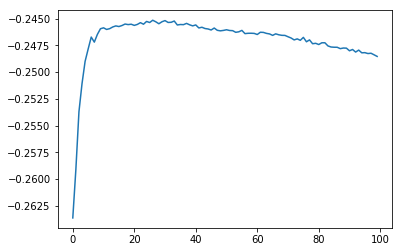

In [274]:
plt.plot(scores);

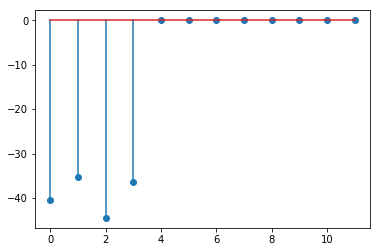

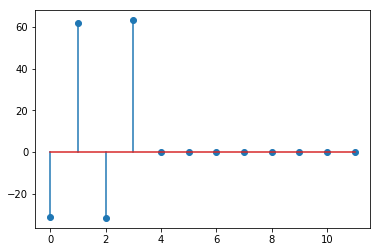

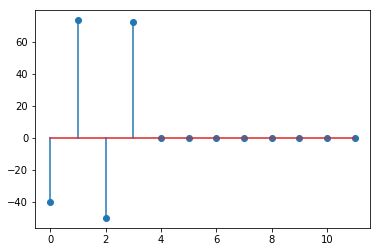

In [275]:
buvwx, buvwy, buvwz = T.reshape((3,-1))
plt.stem(buvwx[::10]);
plt.show();
plt.stem(buvwy[::10]);
plt.show();
plt.stem(buvwz[::10]);
plt.show();

# Draw results

In [276]:
local_params, centroid_m, centroid_f, xdim_m, ydim_m, zdim_m, xdim_f, ydim_f, zdim_f = \
(T, 
  aligner.centroid_m, aligner.centroid_f,
  aligner.xdim_m, aligner.ydim_m, aligner.zdim_m, 
  aligner.xdim_f, aligner.ydim_f, aligner.zdim_f)

Compute NuPx/NvPy/NwPz: 0.14 seconds.
Compute NuNvNw: 0.05 seconds.
Compute NuPx/NvPy/NwPz: 0.14 seconds.
Compute NuNvNw: 0.05 seconds.
Compute NuPx/NvPy/NwPz: 0.13 seconds.
Compute NuNvNw: 0.05 seconds.
Compute NuPx/NvPy/NwPz: 0.14 seconds.
Compute NuNvNw: 0.05 seconds.
Compute NuPx/NvPy/NwPz: 0.13 seconds.
Compute NuNvNw: 0.05 seconds.
Compute NuPx/NvPy/NwPz: 0.13 seconds.
Compute NuNvNw: 0.05 seconds.
Compute NuPx/NvPy/NwPz: 0.13 seconds.
Compute NuNvNw: 0.05 seconds.
Compute NuPx/NvPy/NwPz: 0.14 seconds.
Compute NuNvNw: 0.05 seconds.


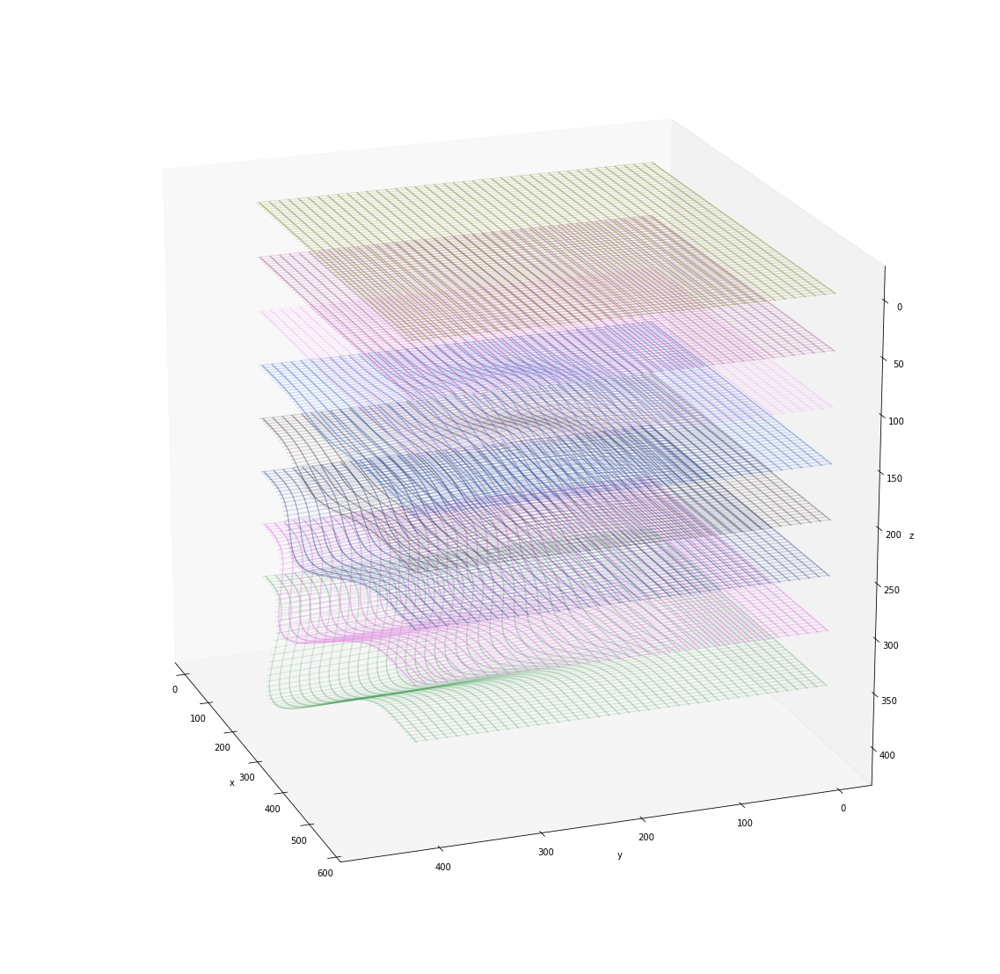

In [278]:
# See how each slice transforms.

from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(20,20));
ax = fig.add_subplot(111, projection='3d')

for z in range(0, zdim_m, 50):
# for z in [100]:

    grid_points = return_gridline_points_v2(volume_moving[1].shape[1], volume_moving[1].shape[0], spacing=10, z=z)
    warped_grid_points = transform_points_bspline(buvwx, buvwy, buvwz, 
                                                  volume_shape=(xdim_m, ydim_m, zdim_m), interval=100, 
                                                  pts=grid_points, c=centroid_m, c_prime=centroid_f)
    
    ax.scatter(warped_grid_points[:,0], warped_grid_points[:,1], warped_grid_points[:,2], 
               c=np.random.random((3,)), marker='.', s=.1, alpha=.5)

ax.view_init(200, 200) # looking from front back
# ax.view_init(0, 0) # looking from front back
# ax.view_init(0, -90) # looking from up down
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax = plt.gca()
ax.grid(False)
plt.show()

Compute NuPx/NvPy/NwPz: 0.14 seconds.
Compute NuNvNw: 0.05 seconds.


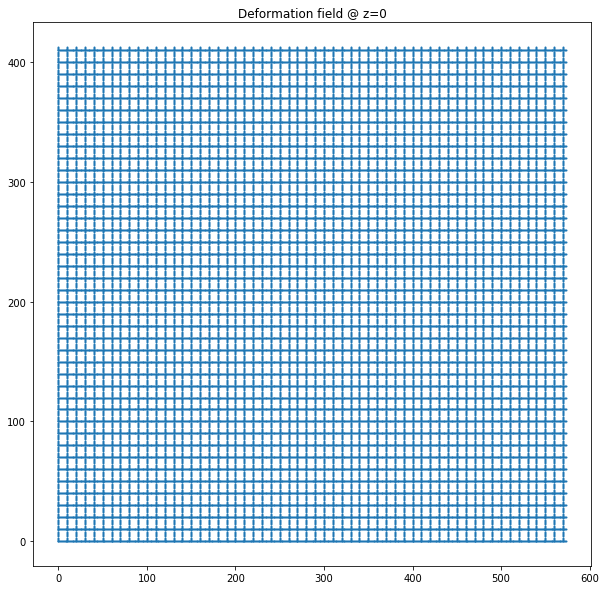

Compute NuPx/NvPy/NwPz: 0.14 seconds.
Compute NuNvNw: 0.05 seconds.


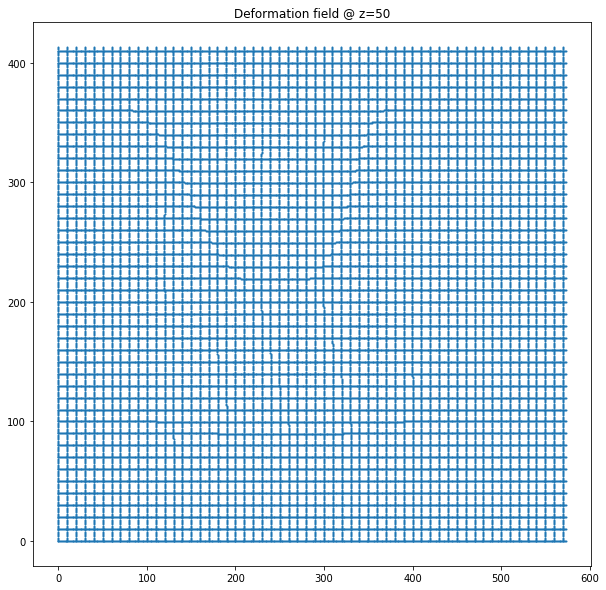

Compute NuPx/NvPy/NwPz: 0.14 seconds.
Compute NuNvNw: 0.05 seconds.


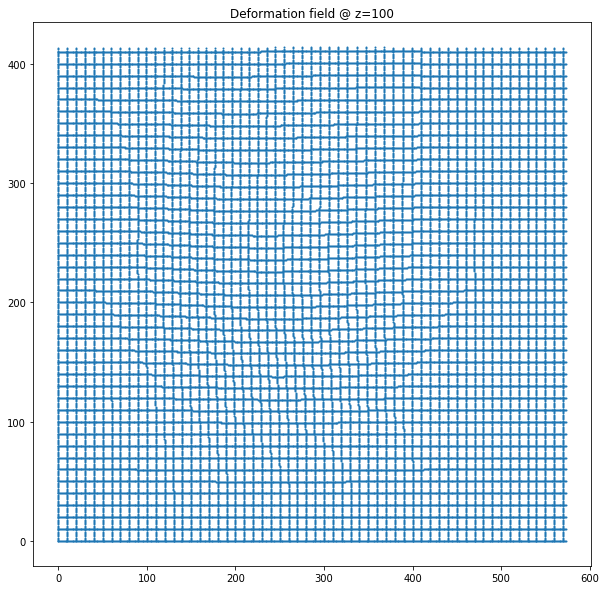

Compute NuPx/NvPy/NwPz: 0.14 seconds.
Compute NuNvNw: 0.05 seconds.


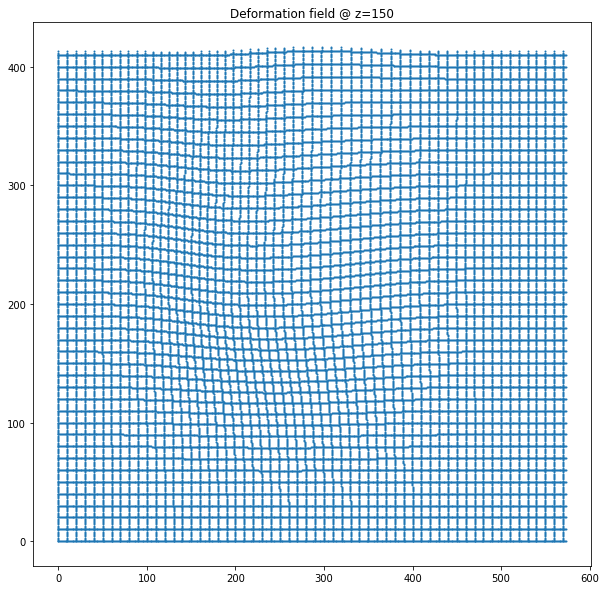

Compute NuPx/NvPy/NwPz: 0.13 seconds.
Compute NuNvNw: 0.05 seconds.


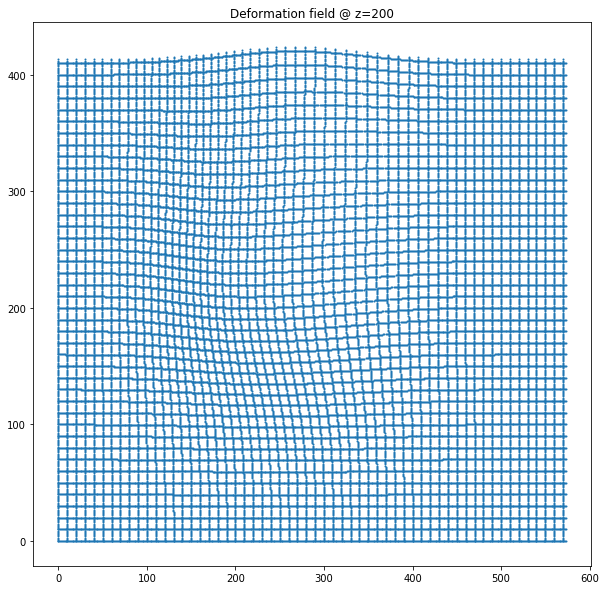

Compute NuPx/NvPy/NwPz: 0.14 seconds.
Compute NuNvNw: 0.05 seconds.


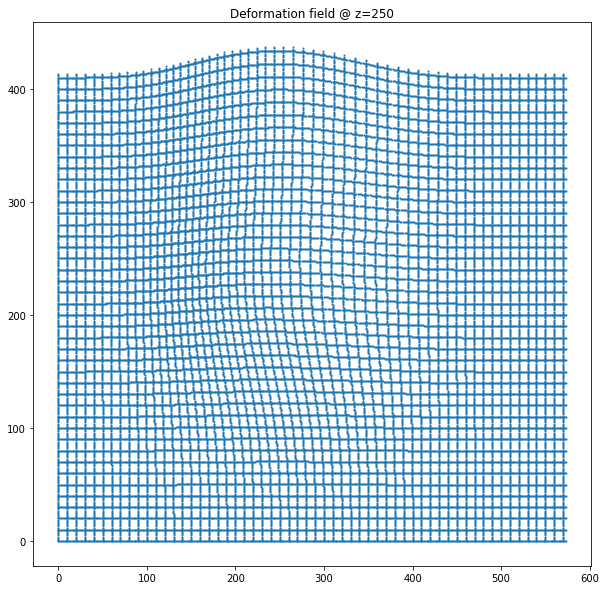

Compute NuPx/NvPy/NwPz: 0.14 seconds.
Compute NuNvNw: 0.05 seconds.


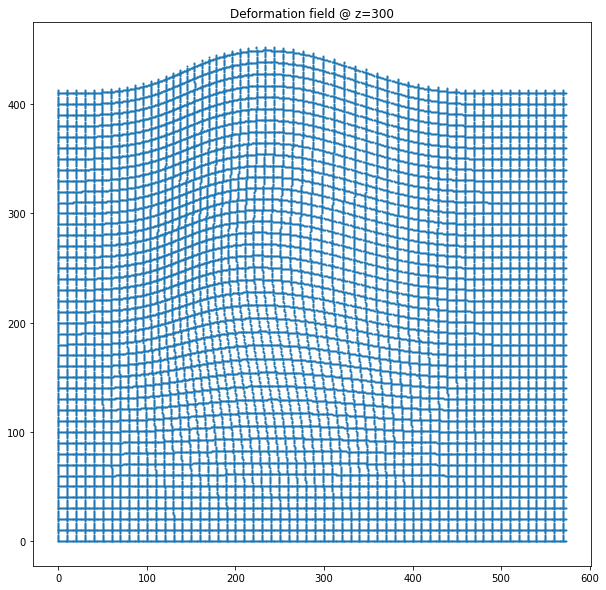

Compute NuPx/NvPy/NwPz: 0.14 seconds.
Compute NuNvNw: 0.05 seconds.


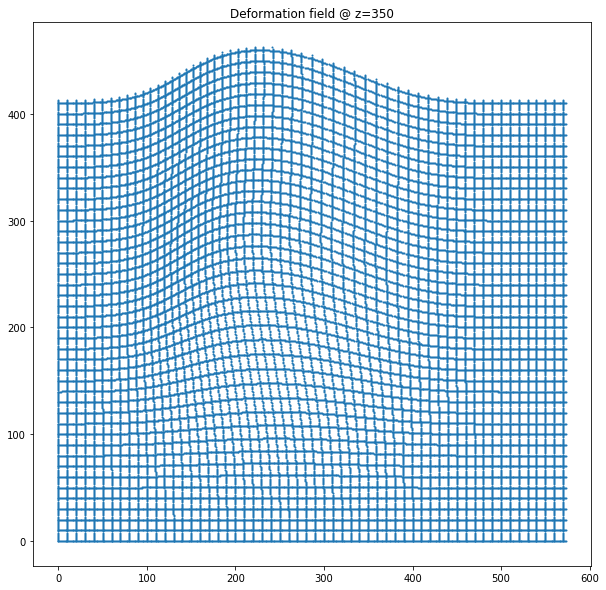

In [285]:
# See the slices in 2D.

for z in range(0, volume_moving[1].shape[2], 50):

    def return_gridline_points(xs, ys, w, h, z):
        grid_points = np.array([(x,y,z) for x in range(w) for y in ys] + [(x,y,z) for x in xs for y in range(h)])
        return grid_points

    grid_points = return_gridline_points(range(0,volume_fixed[1].shape[1],10), 
                                         range(0,volume_fixed[1].shape[0],10), 
                                         volume_fixed[1].shape[1], 
                                         volume_fixed[1].shape[0], z)

    warped_grid_points = transform_points_bspline(buvwx, buvwy, buvwz, 
                                                  volume_shape=(xdim_m, ydim_m, zdim_m), interval=100, 
                                                  pts=grid_points, c=centroid_m, c_prime=centroid_f)

    plt.figure(figsize=(10, 10));
    plt.scatter(warped_grid_points[:,0], warped_grid_points[:,1], s=1)
    plt.title('Deformation field @ z=%d' % z)
    plt.show()

In [36]:
# local_params, centroid_m, centroid_f, xdim_m, ydim_m, zdim_m, xdim_f, ydim_f, zdim_f = \
# ([1,0,0,0,0,1,0,0,0,0,1,0], 
#   aligner.centroid_m, aligner.centroid_f,
#   aligner.xdim_m, aligner.ydim_m, aligner.zdim_m, 
#   aligner.xdim_f, aligner.ydim_f, aligner.zdim_f)

# Read global tx
# global_transformed_moving_structure_vols = \
# DataManager.load_transformed_volume_all_known_structures(stack_m=stack_moving, stack_f=stack_fixed,
#                                     classifier_setting_m=classifier_setting,
#                                     classifier_setting_f=classifier_setting,
#                                     warp_setting=upstream_warp_setting)

In [280]:
vols_m2f = {}
vols_m2f_bboxes = {}
vols_m2f_g = {}
vols_m2f_g_bboxes = {}

for ind_m, v in volume_moving.iteritems():
# for ind_m in [structure_to_label_moving['VLL_L']]:
#     v = volume_moving[ind_m]

    if label_to_structure_moving[ind_m] in structure_subset:

        vol_m2f_g_bbox = bbox_3d(v)
        vol_m2f_g_xmin, vol_m2f_g_xmax, vol_m2f_g_ymin, vol_m2f_g_ymax, vol_m2f_g_zmin, vol_m2f_g_zmax = vol_m2f_g_bbox
        vol_m2f_g = v[vol_m2f_g_ymin:vol_m2f_g_ymax+1, 
                                                            vol_m2f_g_xmin:vol_m2f_g_xmax+1,
                                                            vol_m2f_g_zmin:vol_m2f_g_zmax+1]

        vol_m2f, vol_m2f_bbox = \
        transform_volume_bspline((vol_m2f_g, vol_m2f_g_bbox), buvwx, buvwy, buvwz, 
                                 volume_shape=(xdim_m, ydim_m, zdim_m), 
                                 interval=100, 
                                 centroid_m=centroid_m, centroid_f=centroid_f)

        vols_m2f[ind_m] = vol_m2f
        vols_m2f_bboxes[ind_m] = vol_m2f_bbox

        vols_m2f_g[ind_m] = vol_m2f_g
        vols_m2f_g_bboxes[ind_m] = vol_m2f_g_bbox

Compute NuPx/NvPy/NwPz: 0.61 seconds.
Compute NuNvNw: 0.20 seconds.
Compute NuPx/NvPy/NwPz: 0.78 seconds.
Compute NuNvNw: 0.24 seconds.
Compute NuPx/NvPy/NwPz: 0.63 seconds.
Compute NuNvNw: 0.20 seconds.
Compute NuPx/NvPy/NwPz: 0.78 seconds.
Compute NuNvNw: 0.24 seconds.


In [62]:
# display_volume_sections(vols_m2f[structure_to_label_moving['7n_L']].astype(np.float))

In [281]:
# Set colors for different contour level
# levels = [0.1, 0.25, 0.5, 0.75, .99]
levels = [0.5]
level_colors = {level: (int(level*255),0,0) for level in levels} # after bspline, red
level_colors2 = {level: (0,int(level*255),0) for level in levels} # before bspline, green

In [282]:
c = 0

0 573 0 413 93 452
rm -rf "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-IHC35-2015.09.15-02.58.30_MD595_2_0104_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif" && mkdir -p "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped"
aws s3 cp "s3://mousebrainatlas-data/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-IHC35-2015.09.15-02.58.30_MD595_2_0104_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif" "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-IHC35-2015.09.15-02.58.30_MD595_2_0104_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif"
165


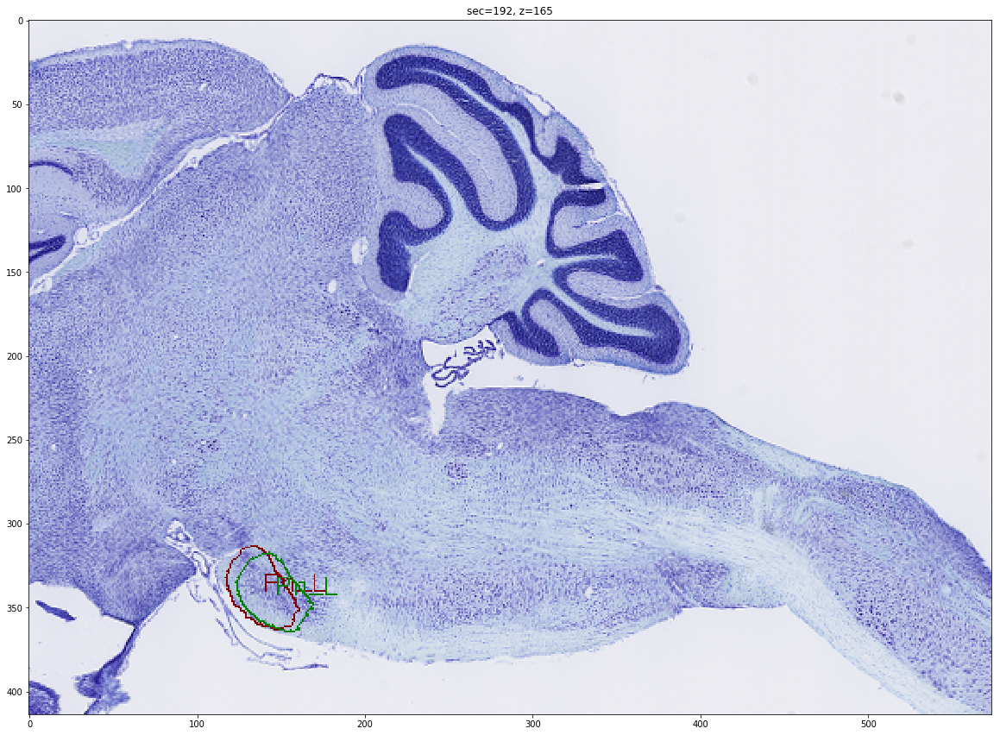

rm -rf "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-N37-2015.09.14-21.31.31_MD595_1_0109_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif" && mkdir -p "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped"
aws s3 cp "s3://mousebrainatlas-data/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-N37-2015.09.14-21.31.31_MD595_1_0109_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif" "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-N37-2015.09.14-21.31.31_MD595_1_0109_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif"
172
rm -rf "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-IH

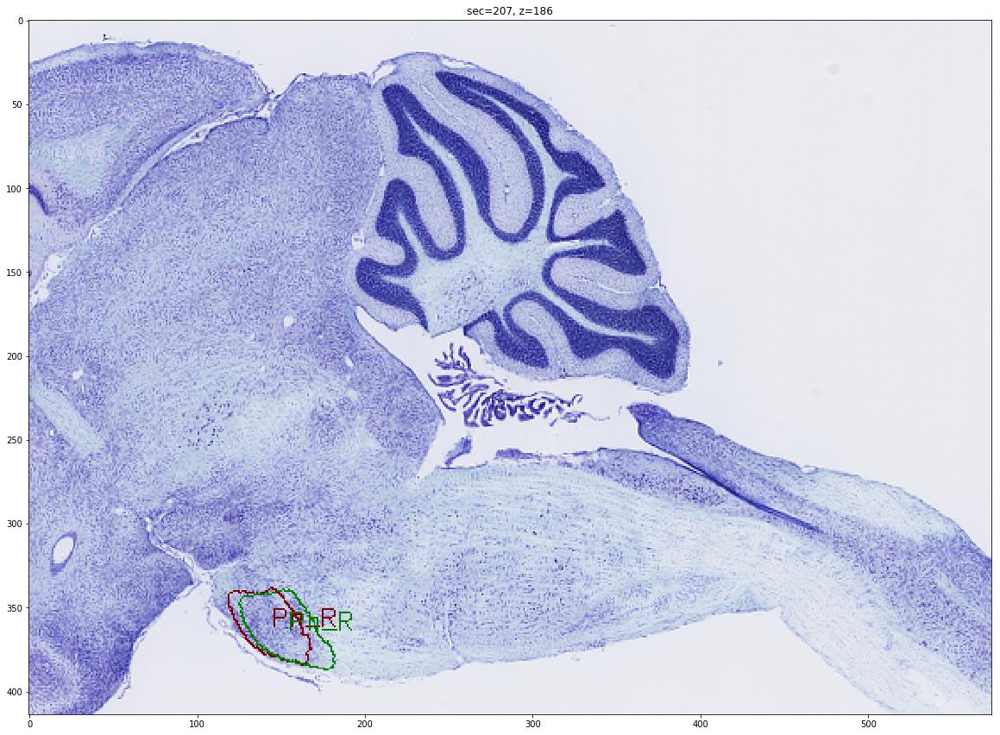

rm -rf "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-IHC40-2015.09.15-03.19.26_MD595_2_0119_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif" && mkdir -p "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped"
aws s3 cp "s3://mousebrainatlas-data/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-IHC40-2015.09.15-03.19.26_MD595_2_0119_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif" "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-IHC40-2015.09.15-03.19.26_MD595_2_0119_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif"
192


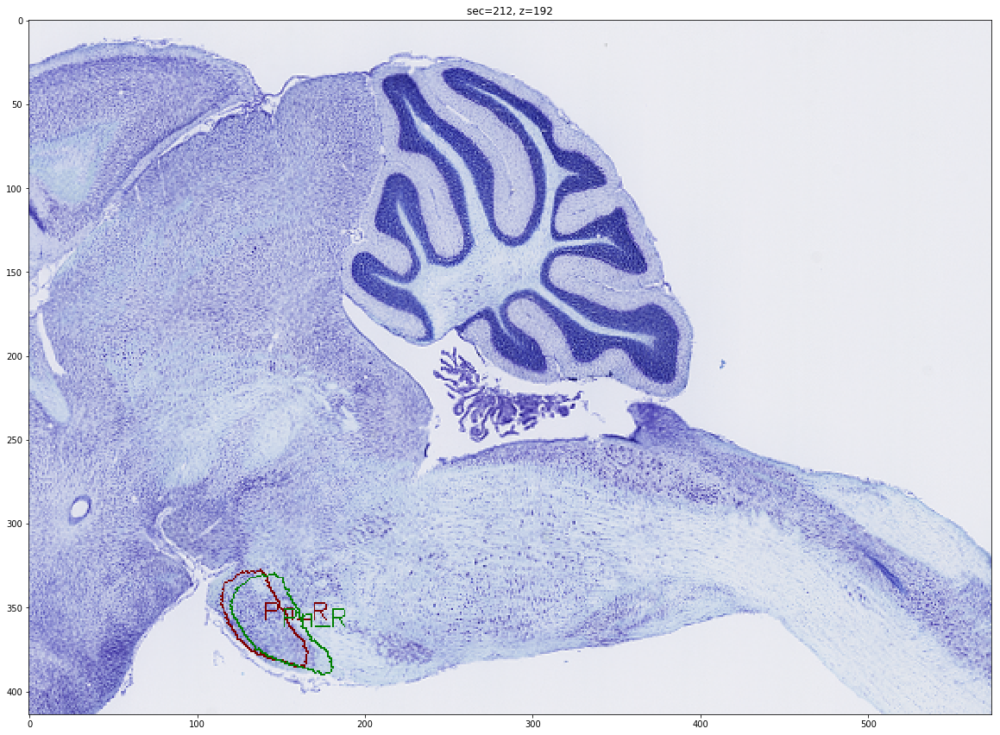

rm -rf "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-N42-2015.09.14-21.52.34_MD595_3_0124_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif" && mkdir -p "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped"
aws s3 cp "s3://mousebrainatlas-data/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-N42-2015.09.14-21.52.34_MD595_3_0124_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif" "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-N42-2015.09.14-21.52.34_MD595_3_0124_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif"
199


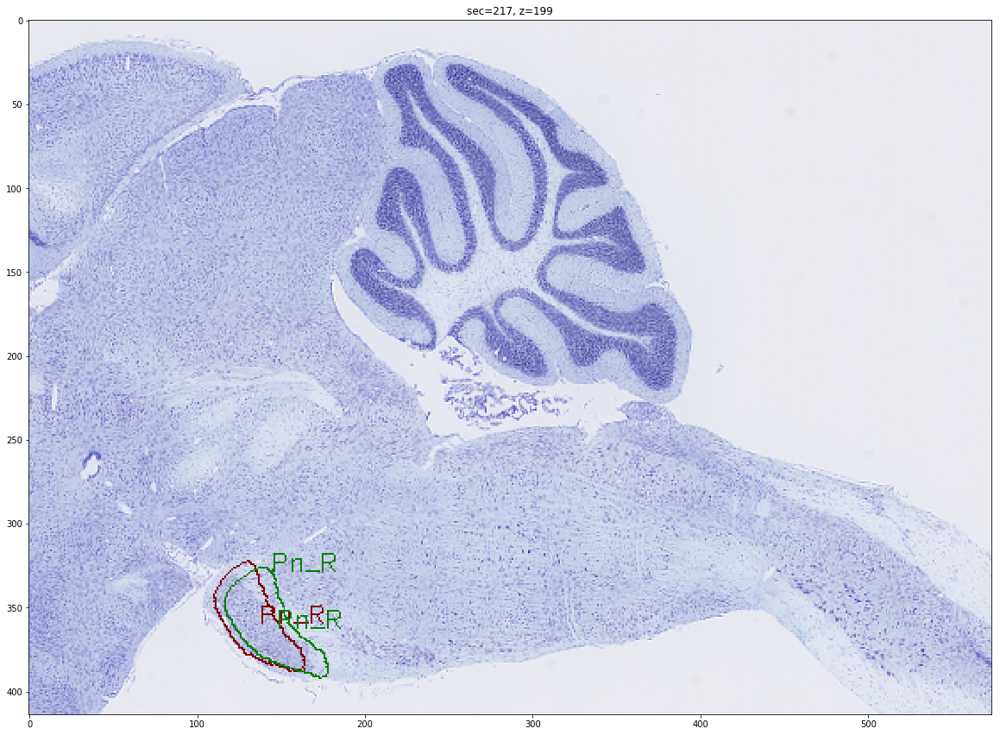

rm -rf "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-IHC43-2015.09.15-03.32.21_MD595_3_0127_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif" && mkdir -p "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped"
aws s3 cp "s3://mousebrainatlas-data/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-IHC43-2015.09.15-03.32.21_MD595_3_0127_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif" "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-IHC43-2015.09.15-03.32.21_MD595_3_0127_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif"
206


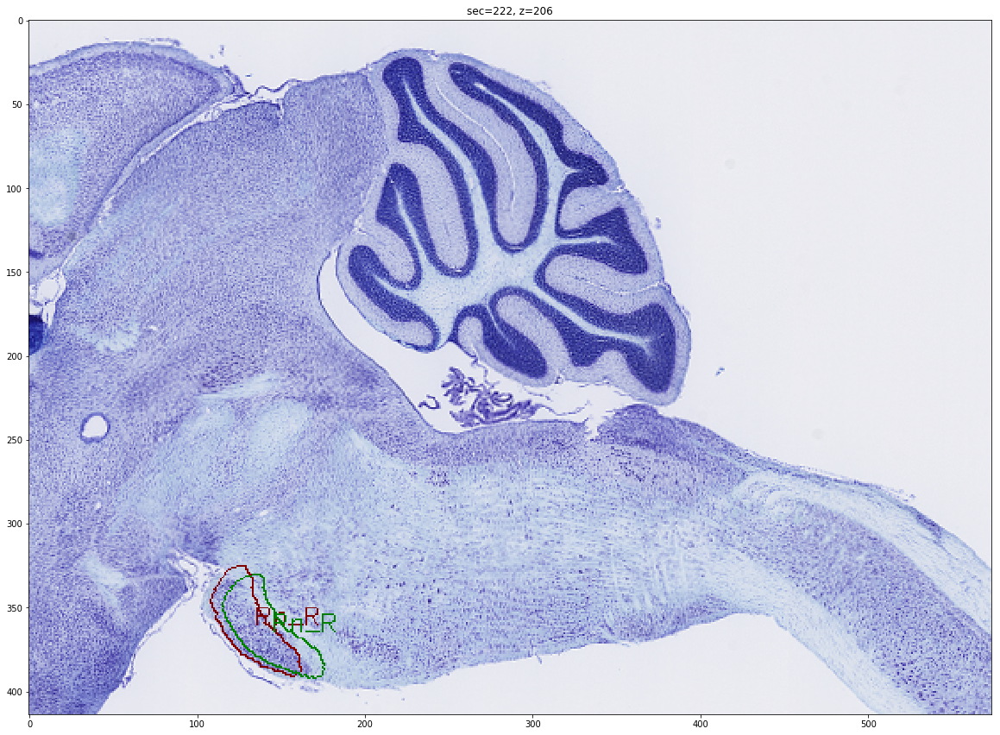

rm -rf "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-N44-2015.09.14-22.01.23_MD595_2_0131_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif" && mkdir -p "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped"
aws s3 cp "s3://mousebrainatlas-data/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-N44-2015.09.14-22.01.23_MD595_2_0131_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif" "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-N44-2015.09.14-22.01.23_MD595_2_0131_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif"
213


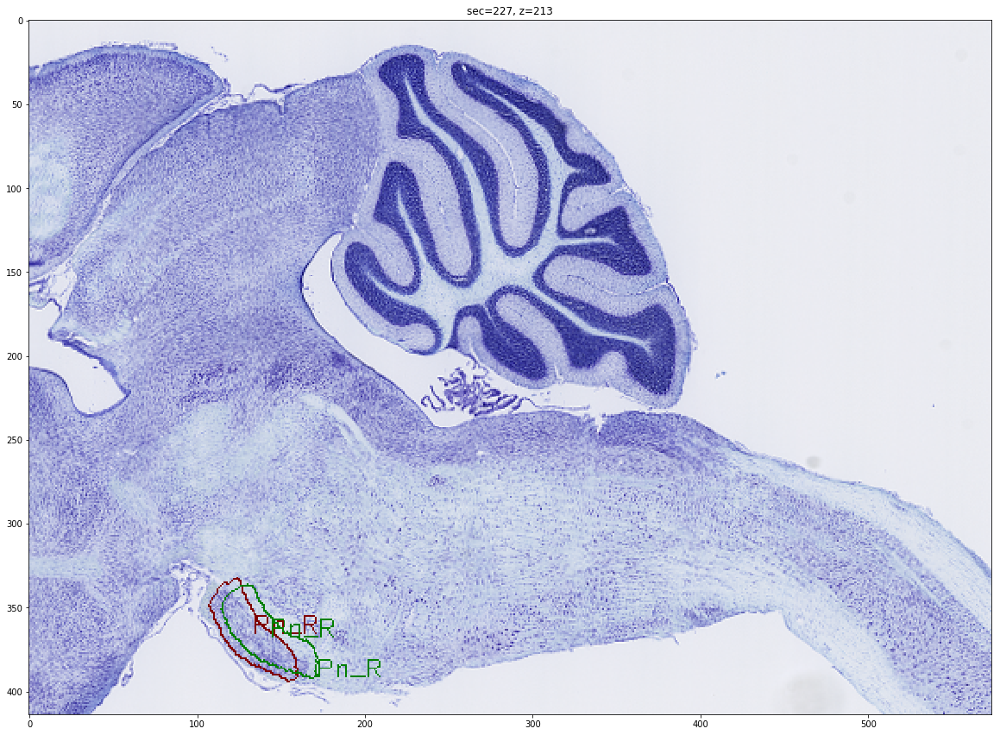

rm -rf "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-IHC45-2015.09.15-03.40.56_MD595_2_0134_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif" && mkdir -p "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped"
aws s3 cp "s3://mousebrainatlas-data/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-IHC45-2015.09.15-03.40.56_MD595_2_0134_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif" "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-IHC45-2015.09.15-03.40.56_MD595_2_0134_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif"
220


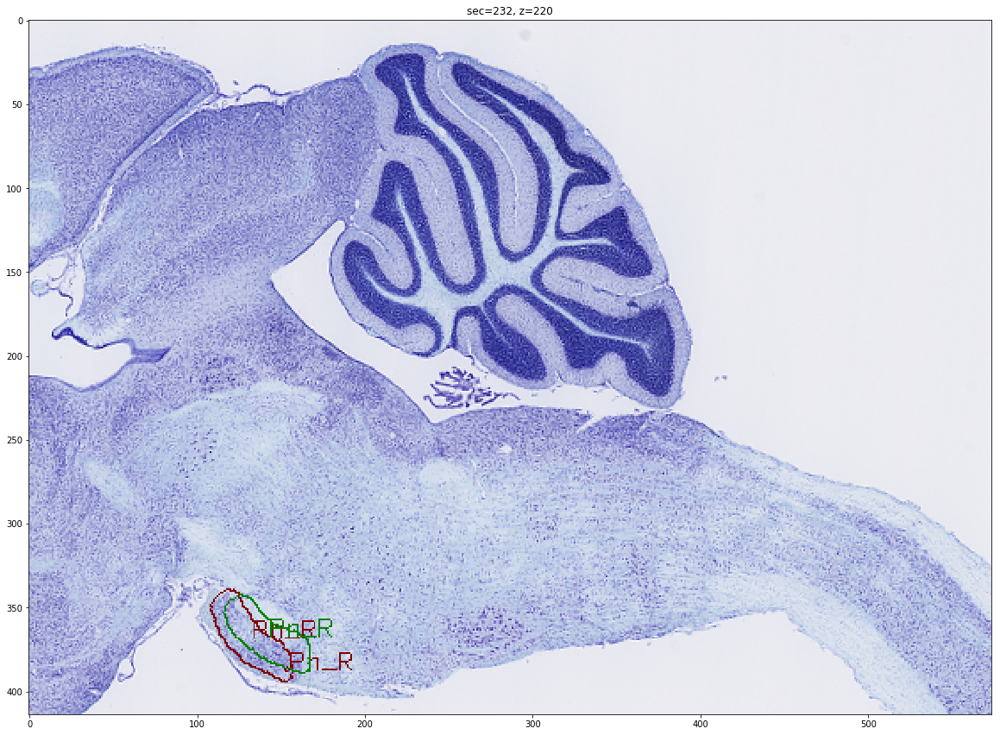

rm -rf "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-N47-2015.09.14-22.14.10_MD595_3_0139_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif" && mkdir -p "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped"
aws s3 cp "s3://mousebrainatlas-data/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-N47-2015.09.14-22.14.10_MD595_3_0139_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif" "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-N47-2015.09.14-22.14.10_MD595_3_0139_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif"
226


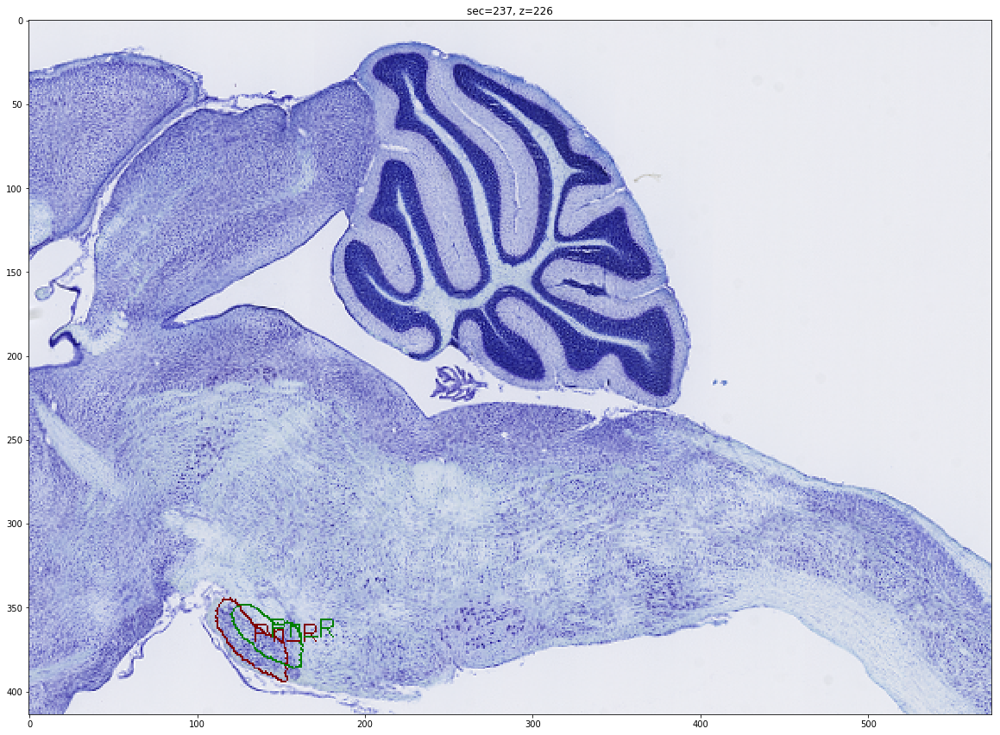

rm -rf "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif" && mkdir -p "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped"
aws s3 cp "s3://mousebrainatlas-data/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif" "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif"


/usr/local/lib/python2.7/dist-packages/skimage/external/tifffile/tifffile.py:2611: RuntimeWarning: py_decodelzw encountered unexpected end of stream
  strip = decompress(strip)


233


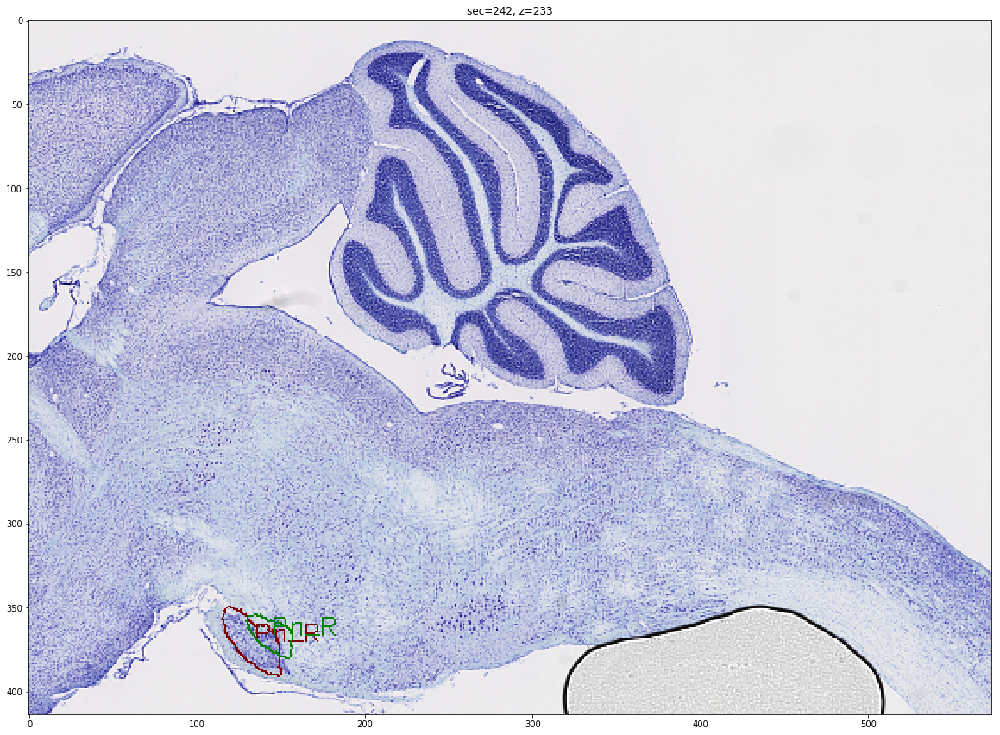

rm -rf "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-N49-2015.09.14-22.22.44_MD595_2_0146_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif" && mkdir -p "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped"
aws s3 cp "s3://mousebrainatlas-data/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-N49-2015.09.14-22.22.44_MD595_2_0146_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif" "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-N49-2015.09.14-22.22.44_MD595_2_0146_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif"
240


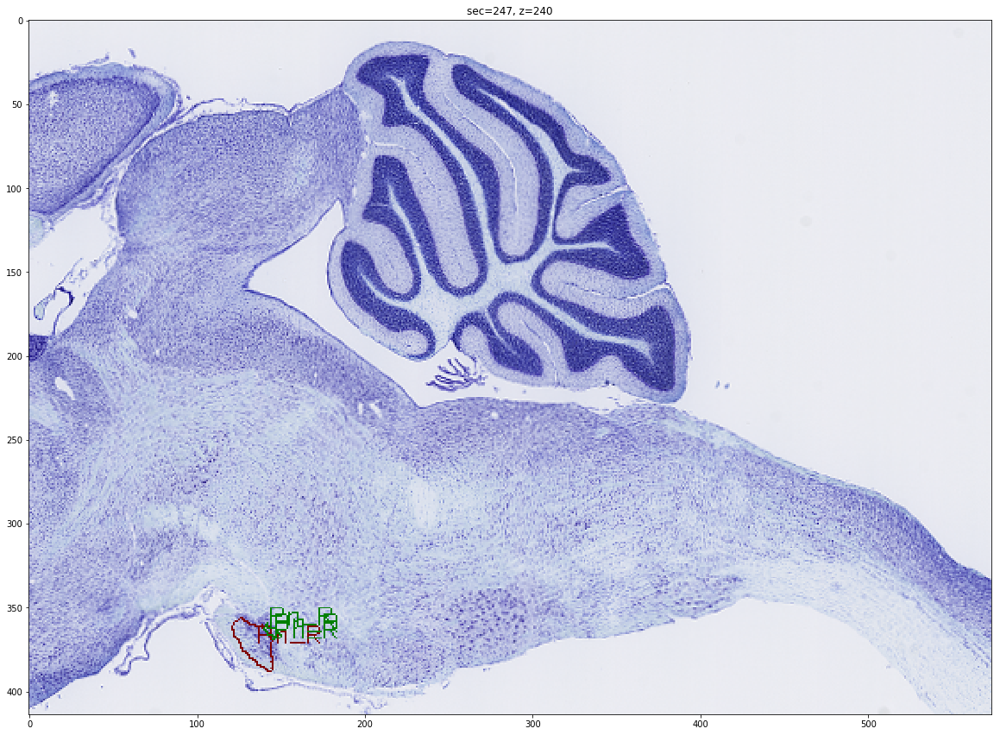

rm -rf "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-IHC50-2015.09.15-03.57.44_MD595_2_0149_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif" && mkdir -p "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped"
aws s3 cp "s3://mousebrainatlas-data/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-IHC50-2015.09.15-03.57.44_MD595_2_0149_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif" "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-IHC50-2015.09.15-03.57.44_MD595_2_0149_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif"
247


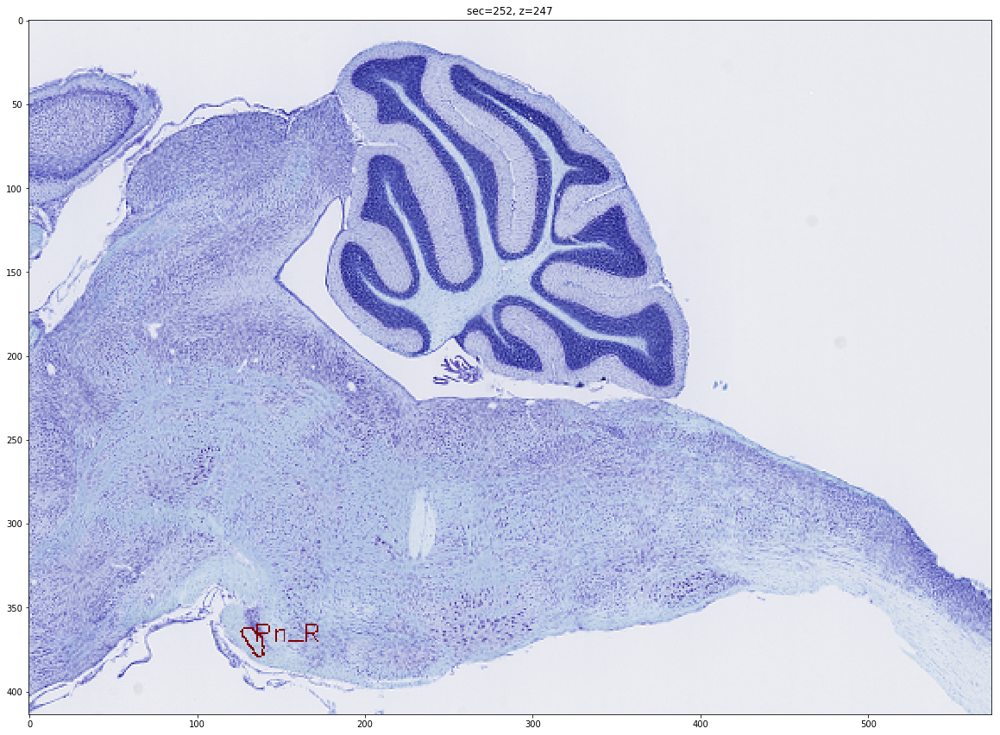

rm -rf "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-N52-2015.09.14-22.34.59_MD595_3_0154_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif" && mkdir -p "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped"
aws s3 cp "s3://mousebrainatlas-data/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-N52-2015.09.14-22.34.59_MD595_3_0154_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif" "/shared/CSHL_data_processed/MD595/MD595_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped/MD595-N52-2015.09.14-22.34.59_MD595_3_0154_thumbnail_alignedTo_MD595-IHC48-2015.09.15-18.38.44_MD595_1_0142_cropped.tif"
254


In [284]:
# Generate overlay visualization

# estimate mapping between z and section
# downsample_factor = 32
# xy_pixel_distance_downsampled = XY_PIXEL_DISTANCE_LOSSLESS * downsample_factor
# voxel_z_size = SECTION_THICKNESS / xy_pixel_distance_downsampled

# For getting correct contour location
xmin_vol_f, xmax_vol_f, ymin_vol_f, ymax_vol_f, zmin_vol_f, zmax_vol_f = \
DataManager.load_original_volume_bbox(stack=stack_fixed, volume_type='score', structure='7N', 
                             downscale=32, detector_id=detector_id, prep_id=2)
print xmin_vol_f, xmax_vol_f, ymin_vol_f, ymax_vol_f, zmin_vol_f, zmax_vol_f

# Generate atlas overlay image for every section

zf, zl = vols_m2f_bboxes[structure_to_label_moving['Pn_R']][4:]
sec_first = DataManager.convert_z_to_section(stack=stack_fixed, z=zf, downsample=32)
sec_last = DataManager.convert_z_to_section(stack=stack_fixed, z=zl, downsample=32)

for sec in range(sec_first, sec_last+1, 5):
# for sec in [181]:

    if is_invalid(stack=stack_fixed, sec=sec):
        continue

    try:
        img = DataManager.load_image(stack=stack_fixed, section=sec, resol='thumbnail', version='cropped_tif')
#         sc_viz_fp = DataManager.get_scoremap_viz_filepath(stack=stack_fixed, section=sec, 
#                                                            downscale=32,
#                                                            structure=convert_to_original_name('7N_L'), 
#                                                            classifier_id=classifier_setting)
#         download_from_s3(sc_viz_fp)
#         img = imread(sc_viz_fp)
    except:
        sys.stderr.write('Error loading scoremap for section %d\n' % sec)
        continue

#     img = img[::4, ::4]

    viz = img.copy()

    z1, z2 = DataManager.convert_section_to_z(stack=stack_fixed, sec=sec, downsample=32)
    z = int(z1)
    print z
         
    # Find moving volume annotation contours
    
    for ind_m in vols_m2f.keys():
        
        if is_surround_label(label_to_structure_moving[ind_m]):
            continue
        
        vol_m2f = vols_m2f[ind_m]
        vol_m2f_bbox = vols_m2f_bboxes[ind_m]
        vol_m2f_g = vols_m2f_g[ind_m]
        vol_m2f_g_bbox = vols_m2f_g_bboxes[ind_m]
        
        # Show contours after bspline
        if z >= vol_m2f_bbox[4] and z < vol_m2f_bbox[4] + vol_m2f.shape[2]:

            c = 0
            for level in levels:
                cnts = find_contours(vol_m2f[..., z - vol_m2f_bbox[4]], level=level) # rows, cols
                c += len(cnts)
                for cnt in cnts:
                    # r,c to x,y
                    cnt_on_cropped = cnt[:,::-1] + (xmin_vol_f, ymin_vol_f) + (vol_m2f_bbox[0], vol_m2f_bbox[2])
                    cv2.polylines(viz, [cnt_on_cropped.astype(np.int)], True, level_colors[level], 1)
                    if level == 0.5:
                        cv2.putText(viz, label_to_structure_moving[ind_m], tuple(cnt_on_cropped.mean(axis=0).astype(np.int)), cv2.FONT_HERSHEY_SIMPLEX, .5, (level_colors[level]), 1)
            
        # Show contours before bspline
        if z >= vol_m2f_g_bbox[4] and z < vol_m2f_g_bbox[4] + vol_m2f_g.shape[2]:
                    
            for level in levels:
                cnts = find_contours(vol_m2f_g[..., z - vol_m2f_g_bbox[4]], level=level) # rows, cols
                c += len(cnts)
                for cnt in cnts:
                    # r,c to x,y
                    cnt_on_cropped = cnt[:,::-1] + (xmin_vol_f, ymin_vol_f) + (vol_m2f_g_bbox[0], vol_m2f_g_bbox[2])
                    cv2.polylines(viz, [cnt_on_cropped.astype(np.int)], True, level_colors2[level], 1)
                    if level == 0.5:
                        cv2.putText(viz, label_to_structure_moving[ind_m], tuple(cnt_on_cropped.mean(axis=0).astype(np.int)), cv2.FONT_HERSHEY_SIMPLEX, .5, (level_colors2[level]), 1)
                    
    if c > 0:    
        plt.figure(figsize=(20, 20));
        plt.title("sec=%d, z=%d" % (sec, z));
        plt.imshow(viz);
        plt.show();